In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
sns.set
from pandas_datareader import data as pdr
from collections import deque
import random
import tensorflow

In [1]:
from gymnasium import Env
from gym import spaces
from gymnasium.spaces import Discrete, Box, MultiDiscrete
import numpy as np
import random
from enum import Enum
from gym.utils import seeding
from stable_baselines3.common.vec_env import DummyVecEnv
from stable_baselines3.common.evaluation import evaluate_policy
from sb3_contrib import RecurrentPPO
from stable_baselines3 import PPO
import os
import pandas_ta as ta
from stable_baselines3 import   DQN# A2C
from stable_baselines3 import   A2C

In [4]:
data = yf.download(tickers = '^RUI', start = '2012-03-11',end = '2023-01-25')
data.head(10)

NameError: name 'yf' is not defined

In [20]:
data = pd.read_csv('USDCHF_Candlestick_4_Hour_BID_14.12.2007-14.12.2022.csv')

In [21]:
class Actions(Enum):
    Sell = 0
    Buy = 1
    Rest = 2

class Positions(Enum):
    Short = 0 #on sell position
    Long = 1  #on buy position
    Rest = 2
    def opposite(self):
        k = np.random.randint(2)
        if k == 0:
            return  Positions.Short
        if k == 1:
            return Positions.Long
        
        #return Positions.Short if self == Positions.Long else Positions.Long
    def rest(self):
        return Positions.Rest
    
class Customtradingenv(Env):
   
    metadata = {'render.modes': ['human']}

    def __init__(self, df, window_size, frame_bound, unit_side='left'):
        
        assert df.ndim == 2
        assert len(frame_bound) == 2
        assert unit_side.lower() in ['left', 'right']
        self.frame_bound = frame_bound
        self.unit_side = unit_side.lower()
        self.seed()
        self.df = df
        self.window_size = window_size
        self.prices, self.signal_features = self._process_data()
        self.shape = (window_size, self.signal_features.shape[1])

        # spaces
        self.action_space = spaces.Discrete(len(Actions))
        #self.action_space = Discrete(len(Actions))
        self.observation_space = spaces.Box(low=-np.inf, high=np.inf, shape=self.shape, dtype=np.float64)

        # episode
        self._start_tick = self.window_size
        self._end_tick = len(self.prices) - 1
        self._done = None
        self._current_tick = None
        self._last_trade_tick = None
        self._position = None
        self._position_history = None
        self._total_reward = None
        self._total_profit = None
        self._first_rendering = None
        self.history = None

        self.trade_fee = 0.0003  # unit
        
        
    def seed(self, seed=None):
        self.np_random, seed = seeding.np_random(seed)
        return [seed]
    
    def reset(self):
        self._done = False
        self._current_tick = self._start_tick
        self._last_trade_tick = self._current_tick - 1
        self._position = Positions.Short
        self._position_history = (self.window_size * [None]) + [self._position]
        self._total_reward = 0.
        self._total_profit = 1.  # unit
        self._first_rendering = True
        self.history = {}
        return self._get_observation()


        # self.custom = .
    def step(self, action):
        self._done = False 
        
        
        self._current_tick += 1
        
        if self._current_tick == self._end_tick:
            self._done = True

        step_reward = self._calculate_reward(action)
        self._total_reward += step_reward

        self._update_profit(action)

        trade = False
        if ((action == Actions.Buy.value and self._position == Positions.Short) or
            (action == Actions.Sell.value and self._position == Positions.Long)):
                  trade = True
        
        
        if trade:
            self._position = self._position.opposite()
            self._last_trade_tick = self._current_tick
        #if self._calculate_reward(action) == 0:
         #    self._position = self._position.rest()
                

        self._position_history.append(self._position)
        observation = self._get_observation()
        info = dict(
            total_reward = self._total_reward,
            total_profit = self._total_profit,
            position = self._position.value
        )
        self._update_history(info)

        return observation, step_reward, self._done, info

    def _get_observation(self):
        return self.signal_features[(self._current_tick-self.window_size+1):self._current_tick+1]


    def _update_history(self, info):
        if not self.history:
            self.history = {key: [] for key in info.keys()}

        for key, value in info.items():
            self.history[key].append(value)


        #check if shower is done
    def render(self, mode='human'):

        def _plot_position(position, tick):
            color = None
            if position == Positions.Short:
                color = 'red'
            elif position == Positions.Long:
                color = 'green'
            elif position ==  Positions.Rest:
                color = 'blue'
            if color:
                plt.scatter(tick, self.prices[tick], color=color)

        if self._first_rendering:
            self._first_rendering = False
            plt.cla()
            plt.plot(self.prices)
            start_position = self._position_history[self._start_tick]
            _plot_position(start_position, self._start_tick)

        _plot_position(self._position, self._current_tick)

        plt.suptitle(
            "Total Reward: %.6f" % self._total_reward + ' ~ ' +
            "Total Profit: %.6f" % self._total_profit
        )

        plt.pause(0.01)


    def render_all(self, mode='human'):
        window_ticks = np.arange(len(self._position_history))
        plt.plot(self.prices)

        short_ticks = []
        long_ticks = []
        rest_ticks = []
        for i, tick in enumerate(window_ticks):
            if self._position_history[i] == Positions.Short:
                short_ticks.append(tick)
            elif self._position_history[i] == Positions.Long:
                long_ticks.append(tick)
            elif self._position_history[i] == Positions.Rest:
                rest_ticks.append(tick)

        plt.plot(short_ticks, self.prices[short_ticks], 'rv')
        plt.plot(long_ticks, self.prices[long_ticks], 'g^')
        plt.plot(rest_ticks, self.prices[rest_ticks], 'b^' )

        plt.suptitle(
            "Total Reward: %.6f" % self._total_reward + ' ~ ' +
            "Total Profit: %.6f" % self._total_profit
        )
        
        pass
    def close(self):
        plt.close()


    def save_rendering(self, filepath):
        plt.savefig(filepath)
        
    def pause_rendering(self):
        plt.show()

    
    def _process_data(self):
        prices = self.df.loc[:, 'Close'].to_numpy()

        prices[self.frame_bound[0] - self.window_size]  # validate index (TODO: Improve validation)
        prices = prices[self.frame_bound[0]-self.window_size:self.frame_bound[1]]
        diff = np.insert(np.diff(prices), 0, 0)
        signal_features = np.column_stack((prices, diff))
        
        
        
        start = self.frame_bound[0] - self.window_size
        end = self.frame_bound[1]
        prices = self.df.loc[:, 'Low'].to_numpy()[start:end]
        signal_features = self.df.loc[:, ['EMAF', 'EMAM', 'EMAS', 'slopeEMAF', 'slopeEMAM', 'slopeEMAS', 'RSISlope', 'signal', 'ATR', 'RSI']].to_numpy()[start:end]


        
        return prices, signal_features


    def _calculate_reward(self, action):
        step_reward = 0  # pip
        
        signal = list(self.df['signal'])
        entry = list(self.df['entry'])
        trade, semi = 0, False
        if ((action == Actions.Buy.value and self._position == Positions.Short) or
            (action == Actions.Sell.value and self._position == Positions.Long)):
            trade = True
                
    
        if trade:  
            
                 current_price = self.prices[self._current_tick]
                 last_trade_price = self.prices[self._last_trade_tick]
                 self.price_diff = current_price - last_trade_price
                 
                 if self._position == Positions.Short: #meaning on the sell postion but we don't if the trend is up or down 
                          step_reward += -self.price_diff * 10000
                          print('*')
            
                 elif self._position == Positions.Long:
                          step_reward += self.price_diff * 10000
                          print('.')
                              
                 '''elif signal[self._current_tick] == 1 or  signal[self._current_tick] == 0:
                           if self._position == Positions.Long:
                               step_reward += -self.price_diff * 10000
                                
                 elif signal[self._current_tick] == -1:
                           if self._position == Positions.Short:
                               step_reward += self.price_diff * 10000
                    
                 elif entry[self._current_tick] == -2:
                          if self._position == Positions.Short:
                               step_reward += -self.price_diff * 1000000
                                
                 elif entry[self._current_tick] == 2:
                          if self._position == Positions.long:
                               step_reward +=  self.price_diff * 1000000'''
                                
                 
        return step_reward
                
       # if action ==  Actions.Rest.value and self.price_diff * 10000 == 0:
        #    semi = 1

        #if semi == 1:
        #    if self.price_diff == 0:
         #       print('rest')
          #      return 0
                
           
        #return step_reward


    def _update_profit(self, action):
        trade = False
        
        
        if ((action == Actions.Buy.value and self._position == Positions.Short) or
            (action == Actions.Sell.value and self._position == Positions.Long)):
              trade = True
                
       
        if trade or self._done:
            current_price = self.prices[self._current_tick]
            last_trade_price = self.prices[self._last_trade_tick]

            if self.unit_side == 'left':
                if self._position == Positions.Short:
                    quantity = self._total_profit * (last_trade_price - self.trade_fee)
                    self._total_profit = quantity / current_price

            elif self.unit_side == 'right':
                if self._position == Positions.Long:
                    quantity = self._total_profit / last_trade_price
                    self._total_profit = quantity * (current_price - self.trade_fee)


    def max_possible_profit(self):
        current_tick = self._start_tick
        last_trade_tick = current_tick - 1
        profit = 1.

        while current_tick <= self._end_tick:
            position = None
            if self.prices[current_tick] < self.prices[current_tick - 1]:
                while (current_tick <= self._end_tick and
                       self.prices[current_tick] < self.prices[current_tick - 1]):
                    current_tick += 1
                position = Positions.Short
            else:
                while (current_tick <= self._end_tick and
                       self.prices[current_tick] >= self.prices[current_tick - 1]):
                    current_tick += 1
                position = Positions.Long

            current_price = self.prices[current_tick - 1]
            last_trade_price = self.prices[last_trade_tick]

            if self.unit_side == 'left':
                if position == Positions.Short:
                    quantity = profit * (last_trade_price - self.trade_fee)
                    profit = quantity / current_price

            elif self.unit_side == 'right':
                if position == Positions.Long:
                    quantity = profit / last_trade_price
                    profit = quantity * (current_price - self.trade_fee)

            last_trade_tick = current_tick - 1

        return profit

        
            
        
    

In [22]:
data['RSI']=ta.rsi(data.Close, length=100)
data['EMAF']=ta.ema(data.Close, length=5)
data['EMAM']=ta.ema(data.Close, length=12)
data['EMAS']=ta.ema(data.Close, length=150)
data['CCI']=ta.cci(data.High, data.Low, data.Close, length=16)
data['ATR']=ta.atr(data.High, data.Low, data.Close, length=16)
#data['Target'] = data['Close']-data.Open  #data['Adj Close']
#data['Target'] = data['Target'].shift(-1)

#data['TargetClass'] = [1 if data.Target[i]>0 else 0 for i in range(len(data))]

#data['TargetNextClose'] = data['Close'].shift(-1)

backrollingN = 6

from scipy.stats import linregress
def get_slope(array):
    y = np.array(array)
    x = np.arange(len(y))
    slope, intercept, r_value, p_value, std_err = linregress(x,y)
    return slope

data['slopeEMAF'] = data['EMAF'].rolling(window=backrollingN).apply(get_slope, raw=True)
data['slopeEMAM'] = data['EMAM'].rolling(window=backrollingN).apply(get_slope, raw=True)
data['slopeEMAS'] = data['EMAS'].rolling(window=backrollingN).apply(get_slope, raw=True)
data['slopeATR'] = data['ATR'].rolling(window=backrollingN).apply(get_slope, raw=True)
#data1['slopeMA160'] = data1['MA160'].rolling(window=backrollingN).apply(get_slope, raw=True)
#data1['AverageSlope'] = data1['Average'].rolling(window=backrollingN).apply(get_slope, raw=True)
data['RSISlope'] = data['RSI'].rolling(window=backrollingN).apply(get_slope, raw=True)


In [23]:
data['signal'] = np.where(data['EMAF'] > data['EMAM'], 1, 0)
data['signal'] = np.where(data['EMAF'] < data['EMAM'], -1, data['signal'])
data.dropna(inplace=True)
data.head()

data['return'] = np.log(data['Close']).diff()
data['system_return'] = data['signal'] * data['return']
data['entry'] = data.signal.diff()
data[500:]

,Local time,Open,High,Low,Close,Volume,RSI,EMAF,EMAM,EMAS,...,ATR,slopeEMAF,slopeEMAM,slopeEMAS,slopeATR,RSISlope,signal,return,system_return,entry
654,31.03.2008 22:00:00.000 GMT+0100,0.99310,0.99615,0.99270,0.99355,261022.601500,43.234036,0.993491,0.994040,1.010934,...,0.003357,-0.000427,-0.000247,-0.000247,0.000135,-0.048332,-1,0.000453,-0.000453,0.0
655,01.04.2008 02:00:00.000 GMT+0100,0.99355,0.99525,0.99310,0.99425,423484.898500,43.448319,0.993744,0.994072,1.010713,...,0.003281,-0.000213,-0.000176,-0.000240,0.000080,0.097502,-1,0.000704,-0.000704,0.0
656,01.04.2008 06:00:00.000 GMT+0100,0.99425,1.00390,0.99425,1.00385,138625.510700,46.258583,0.997112,0.995577,1.010622,...,0.003679,0.000395,0.000099,-0.000216,0.000089,0.494817,1,0.009609,0.009609,2.0
657,01.04.2008 10:00:00.000 GMT+0100,1.00385,1.00885,1.00290,1.00760,140908.292900,47.292064,1.000608,0.997426,1.010582,...,0.003821,0.001316,0.000569,-0.000171,0.000090,0.919916,1,0.003729,0.003729,0.0
658,01.04.2008 14:00:00.000 GMT+0100,1.00760,1.01400,1.00605,1.01110,253448.200200,48.230636,1.004106,0.999530,1.010589,...,0.004079,0.002227,0.001105,-0.000115,0.000155,1.161527,1,0.003468,0.003468,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32891,14.12.2022 07:00:00.000 GMT+0100,0.92905,0.92957,0.92672,0.92686,24260.080000,42.263439,0.928615,0.930552,0.943009,...,0.002749,-0.000706,-0.000586,-0.000201,-0.000013,0.129668,-1,-0.002349,0.002349,0.0
32892,14.12.2022 11:00:00.000 GMT+0100,0.92686,0.92843,0.92601,0.92661,29322.690000,42.183345,0.927947,0.929946,0.942792,...,0.002728,-0.000641,-0.000575,-0.000205,-0.000045,-0.139405,-1,-0.000270,0.000270,0.0
32893,14.12.2022 15:00:00.000 GMT+0100,0.92662,0.92780,0.92265,0.92491,35625.280000,41.641305,0.926934,0.929171,0.942555,...,0.002880,-0.000655,-0.000591,-0.000211,-0.000009,-0.200215,-1,-0.001836,0.001836,0.0
32894,14.12.2022 19:00:00.000 GMT+0100,0.92490,0.92737,0.92153,0.92417,66988.720000,41.407359,0.926013,0.928401,0.942311,...,0.003065,-0.000768,-0.000653,-0.000222,0.000042,-0.311051,-1,-0.000800,0.000800,0.0


In [24]:
data[200:]

,Local time,Open,High,Low,Close,Volume,RSI,EMAF,EMAM,EMAS,...,ATR,slopeEMAF,slopeEMAM,slopeEMAS,slopeATR,RSISlope,signal,return,system_return,entry
354,10.02.2008 23:00:00.000 GMT+0100,1.10197,1.10315,1.10100,1.10185,21372.700200,50.309541,1.102520,1.102624,1.098995,...,0.001770,-0.000052,-0.000003,0.000051,-0.000105,-0.055393,-1,-0.000907,0.000907,-2.0
355,11.02.2008 03:00:00.000 GMT+0100,1.10185,1.10200,1.09835,1.09920,15836.799800,49.300232,1.101413,1.102097,1.098998,...,0.001887,-0.000237,-0.000096,0.000042,-0.000055,-0.232815,-1,-0.002408,0.002408,0.0
356,11.02.2008 07:00:00.000 GMT+0100,1.09920,1.10075,1.09465,1.09670,42432.157300,48.375410,1.099842,1.101267,1.098967,...,0.002150,-0.000565,-0.000269,0.000026,0.000027,-0.462523,-1,-0.002277,0.002277,0.0
357,11.02.2008 11:00:00.000 GMT+0100,1.09670,1.10400,1.09580,1.10400,28372.913600,51.082016,1.101228,1.101688,1.099034,...,0.002528,-0.000523,-0.000295,0.000019,0.000134,-0.172895,-1,0.006634,-0.006634,0.0
358,11.02.2008 15:00:00.000 GMT+0100,1.10400,1.10470,1.10170,1.10300,20601.480500,50.714108,1.101819,1.101889,1.099087,...,0.002558,-0.000304,-0.000229,0.000021,0.000189,0.042191,-1,-0.000906,0.000906,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32891,14.12.2022 07:00:00.000 GMT+0100,0.92905,0.92957,0.92672,0.92686,24260.080000,42.263439,0.928615,0.930552,0.943009,...,0.002749,-0.000706,-0.000586,-0.000201,-0.000013,0.129668,-1,-0.002349,0.002349,0.0
32892,14.12.2022 11:00:00.000 GMT+0100,0.92686,0.92843,0.92601,0.92661,29322.690000,42.183345,0.927947,0.929946,0.942792,...,0.002728,-0.000641,-0.000575,-0.000205,-0.000045,-0.139405,-1,-0.000270,0.000270,0.0
32893,14.12.2022 15:00:00.000 GMT+0100,0.92662,0.92780,0.92265,0.92491,35625.280000,41.641305,0.926934,0.929171,0.942555,...,0.002880,-0.000655,-0.000591,-0.000211,-0.000009,-0.200215,-1,-0.001836,0.001836,0.0
32894,14.12.2022 19:00:00.000 GMT+0100,0.92490,0.92737,0.92153,0.92417,66988.720000,41.407359,0.926013,0.928401,0.942311,...,0.003065,-0.000768,-0.000653,-0.000222,0.000042,-0.311051,-1,-0.000800,0.000800,0.0


In [10]:
data.dropna(inplace=True)
data.reset_index(inplace = True)
df = data.copy()
data.drop(['Volume', 'Close', 'Date'], axis=1, inplace=True)

KeyError: "['Date'] not found in axis"

In [25]:
env = Customtradingenv(df=data[200:], window_size=12, frame_bound=(12,20012))

In [26]:
env.signal_features

array([[ 1.10251994e+00,  1.10262422e+00,  1.09899522e+00, ...,
        -1.00000000e+00,  1.76954884e-03,  5.03095413e+01],
       [ 1.10141330e+00,  1.10209742e+00,  1.09899794e+00, ...,
        -1.00000000e+00,  1.88707704e-03,  4.93002315e+01],
       [ 1.09984220e+00,  1.10126705e+00,  1.09896750e+00, ...,
        -1.00000000e+00,  2.15038473e-03,  4.83754104e+01],
       ...,
       [ 9.88087420e-01,  9.87501641e-01,  9.98072970e-01, ...,
         1.00000000e+00,  2.13603582e-03,  4.60141458e+01],
       [ 9.89394947e-01,  9.88195234e-01,  9.97992666e-01, ...,
         1.00000000e+00,  2.08190858e-03,  4.59147656e+01],
       [ 9.90343298e-01,  9.88817506e-01,  9.97916472e-01, ...,
         1.00000000e+00,  2.02991429e-03,  4.60501167e+01]])

In [10]:
#lenght = len(df)
state = env.reset()
#mem = [None] * lenght
while True: 
    
    #action, mem = mytarget1(mem)
 
    #print(action)
    action = env.action_space.sample()
    n_state, reward, done, info = env.step(action)
    if done: 
        print("info", info)
        break
        
plt.figure(figsize=(15,6))
plt.cla()
env.render_all()
plt.show()

*
*
.
.
*
.
*
.
.
*
.
.
*
.
*
.
*
*
*
*
.
*
*
*
*
.
*
.
.
.
*
*
.
.
.
*
*
*
.
*
.
*
*
*
.
.
.
*
.
*
.
*
*
*
*
.
.
*
*
*
*
*
*
.
*
*
.
.
.
.
.
.
*
.
*
*
*
*
*
.
.
.
*
.
*
.
*
.
.
*
.
.
.
*
*
.
*
*
*
*
.
*
*
*
.
.
*
.
.
.
.
*
*
*
*
.
.
.
.
*
*
.
.
*
.
*
*
.
.
.
*
.
*
*
*
.
.
.
*
.
*
*
*
*
.
.
.
.
*
*
.
*
.
*
*
.
*
*
*
*
*
.
*
.
.
.
.
.
.
*
.
*
*
.
.
*
.
*
.
*
.
.
*
.
*
*
*
.
.
*
*
.
*
*
.
.
*
*
*
.
*
.
*
.
*
*
.
.
*
.
*
*
*
*
*
.
*
.
.
*
.
*
*
*
*
.
*
*
*
.
*
.
*
.
.
.
.
.
*
.
*
*
*
.
*
*
*
*
.
.
*
.
.
.
.
*
*
*
.
*
.
*
.
.
.
*
*
*
.
*
.
.
.
.
*
.
*
.
*
*
.
*
*
.
.
*
*
*
.
.
.
.
*
*
*
.
*
*
*
*
*
*
.
*
*
.
.
*
.
.
*
.
*
*
.
*
.
*
*
*
.
*
.
.
*
*
*
.
.
.
.
.
.
.
*
*
*
.
*
*
*
.
*
.
*
.
.
*
.
*
.
.
*
*
*
*
*
.
*
*
.
*
*
.
.
.
*
*
*
*
*
.
*
.
*
.
*
*
.
*
.
*
.
*
*
.
.
.
*
*
.
.
*
*
.
*
*
.
*
*
.
*
*
*
.
*
*
*
.
*
*
.
.
*
*
.
*
.
.
.
*
*
*
*
*
.
.
.
.
*
.
*
.
*
.
.
*
.
.
.
.
.
*
*
*
.
.
.
*
*
*
*
.
*
*
*
.
.
*
.
.
.
.
*
*
.
*
*
.
*
.
.
*
.
.
*
*
*
.
*
*
*
.
.
.
*
*
.
*
*
.
*
.
*
.
*
*
*
.
*


KeyboardInterrupt: 

In [27]:
env_maker = lambda: env
env = DummyVecEnv([env_maker])

net_arch = [dict(pi=[4000,4000, 8000, 1000, 1], vf=[4000,4000, 8000, 1000, 1])]

tensorpath = os.path.join('training', 'logs')

In [28]:
tensorpath

'training\\logs'

In [36]:
#model = DQN("MlpPolicy", env, verbose=1, policy_kwargs={'net_arch':net_arch}) #MlpLstmPolicy
#model.learn(total_timesteps=1000000)
                                                               #0.99              #128            #10                  #0.0003             #128
model1 = RecurrentPPO("MlpLstmPolicy", env, verbose=1, gamma = 0.85, batch_size = 6000, n_epochs = 20, learning_rate = 0.00000003,  n_steps = 256, tensorboard_log =tensorpath, policy_kwargs={'net_arch':net_arch}) 


Using cpu device


AttributeError: module 'torch' has no attribute '_six'

In [ ]:
model1.learn(total_timesteps=250000)

Logging to training\logs\RecurrentPPO_32
*
*
*
*
.
.
*
.
.
*
.
.
*
.
.
.
*
*
*
.
*
.
*
*
*
.
*
*
*
*
*
.
*
*
.
*
.
.
*
*
*
*
.
.
*
*
.
*
*
.
.
*
.
*
*
.
*
.
*
*
.
*
.
.
.
.
.
.
*
.
*
*
.
*
*
.
.
*
*
*
.
*
*
.
.
*
.
*
*
----------------------------
| time/              |     |
|    fps             | 27  |
|    iterations      | 1   |
|    time_elapsed    | 9   |
|    total_timesteps | 256 |
----------------------------
*
.
*
.
*
*
*
.
.
.
*
.
.
*
*
.
.
*
*
*
*
.
.
*
*
.
.
.
*
*
*
.
*
.
.
.
.
*
*
.
.
*
*
*
.
.
*
.
*
.
*
*
.
*
.
.
.
*
*
*
*
*
*
.
*
.
.
*
*
.
.
.
*
.
.
*
.
*
.
*
.
.
---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 399       |
|    ep_rew_mean          | -302      |
| time/                   |           |
|    fps                  | 5         |
|    iterations           | 2         |
|    time_elapsed         | 88        |
|    total_timesteps      | 512       |
| train/                  |           |
|    approx_kl

.
.
.
*
*
.
.
.
.
.
.
.
*
.
*
.
*
*
*
*
*
*
.
.
.
.
*
*
*
*
*
.
*
.
*
*
*
.
.
*
*
.
*
*
.
.
.
*
*
*
*
.
*
.
*
*
.
*
*
.
.
.
*
.
.
.
*
*
.
*
.
.
*
.
*
.
.
.
.
.
.
*
.
*
.
*
---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 399       |
|    ep_rew_mean          | -138      |
| time/                   |           |
|    fps                  | 3         |
|    iterations           | 10        |
|    time_elapsed         | 703       |
|    total_timesteps      | 2560      |
| train/                  |           |
|    approx_kl            | 0.0       |
|    clip_fraction        | 0         |
|    clip_range           | 0.2       |
|    entropy_loss         | -1.1      |
|    explained_variance   | 3.94e-05  |
|    learning_rate        | 3e-08     |
|    loss                 | 78.1      |
|    n_updates            | 180       |
|    policy_gradient_loss | -2.16e-08 |
|    value_loss           | 156       |
----------------------------

In [ ]:
env = Customtradingenv(df=data[200:], window_size=12, frame_bound=(20400,20800  ))
obs = env.reset()
while True: 
    obs = obs[np.newaxis, ...]
    action, _states = model1.predict(obs)
    obs, rewards, done, info = env.step(action)
    if done:
        print("info", info)
        break

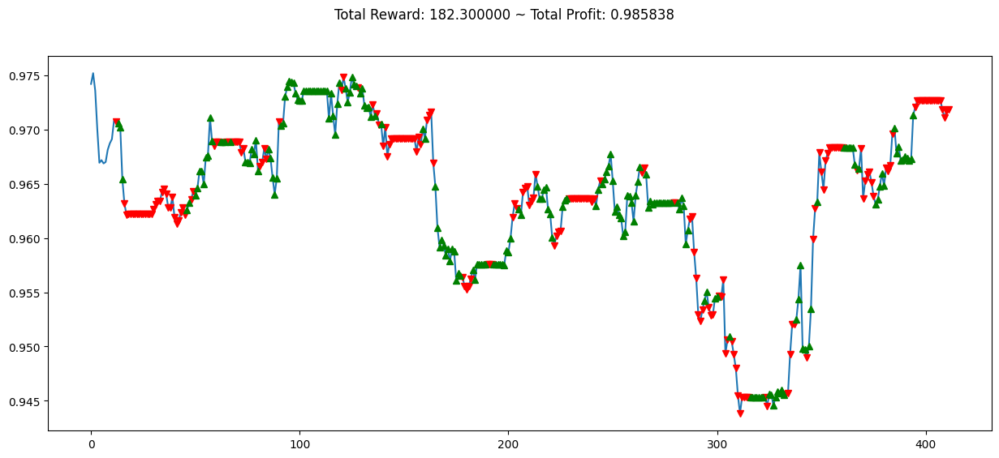

"df = data\nplt.rcParams['figure.figsize'] = 12, 6\nplt.grid(True, alpha = .3)\n\nplt.cla()\nenv.render_all()\n#plt.show()\n\nplt.plot(df.iloc[:400]['Close'], label = 'GLD')\nplt.plot(df.iloc[:400]['EMAF'], label = 'EMAF')\nplt.plot(df.iloc[:400]['EMAM'], label = 'EMAM')\nplt.plot(df[:400].loc[df.entry == 2].index, df[:400]['EMAF'][df.entry == 2], '^',\n         color = 'g', markersize = 12)\nplt.plot(df[:400].loc[df.entry == -2].index, df[:400]['EMAF'][df.entry == -2], 'v',\n         color = 'r', markersize = 12)\nplt.legend(loc=2); "

In [25]:
plt.figure(figsize=(15,6))
plt.cla()
env.render_all()
plt.show()


'''df = data
plt.rcParams['figure.figsize'] = 12, 6
plt.grid(True, alpha = .3)

plt.cla()
env.render_all()
#plt.show()

plt.plot(df.iloc[:400]['Close'], label = 'GLD')
plt.plot(df.iloc[:400]['EMAF'], label = 'EMAF')
plt.plot(df.iloc[:400]['EMAM'], label = 'EMAM')
plt.plot(df[:400].loc[df.entry == 2].index, df[:400]['EMAF'][df.entry == 2], '^',
         color = 'g', markersize = 12)
plt.plot(df[:400].loc[df.entry == -2].index, df[:400]['EMAF'][df.entry == -2], 'v',
         color = 'r', markersize = 12)
plt.legend(loc=2); '''

In [15]:
reccurent_ppo = os.path.join('training', 'save_model', 'reccurent Rl4') # reccurent Rl3 #model1.save(reccurent_ppo)
model1.save(reccurent_ppo)

In [16]:
model1 =  RecurrentPPO.load(reccurent_ppo, env = env)

AttributeError: module 'torch' has no attribute '_utils'

C:\Users\Emakam leumassa\AppData\Local\Programs\Python\Python310\lib\site-packages\stable_baselines3\common\evaluation.py:67: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


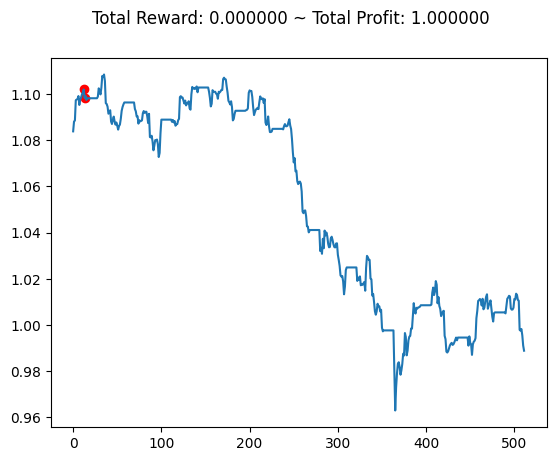

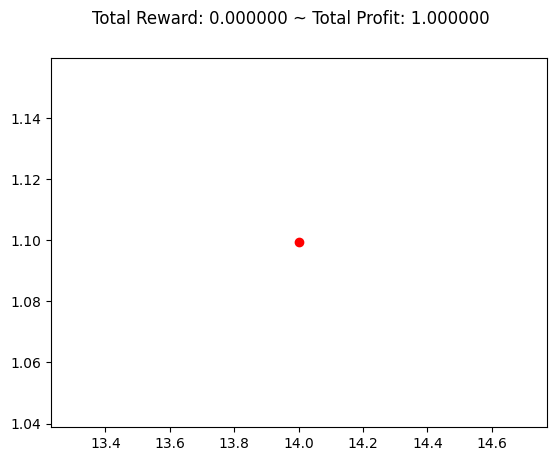

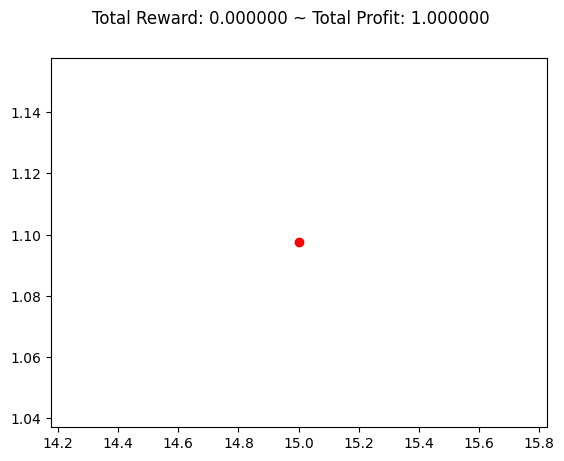

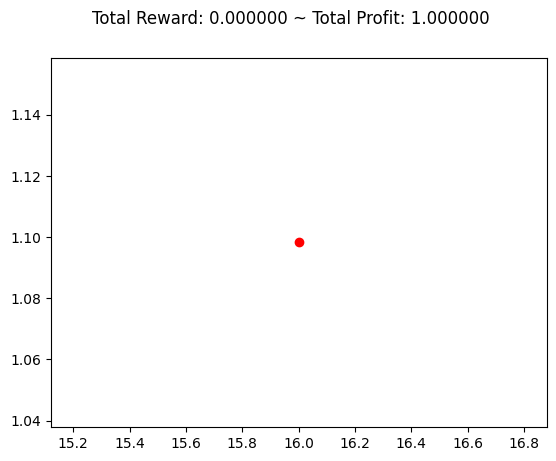

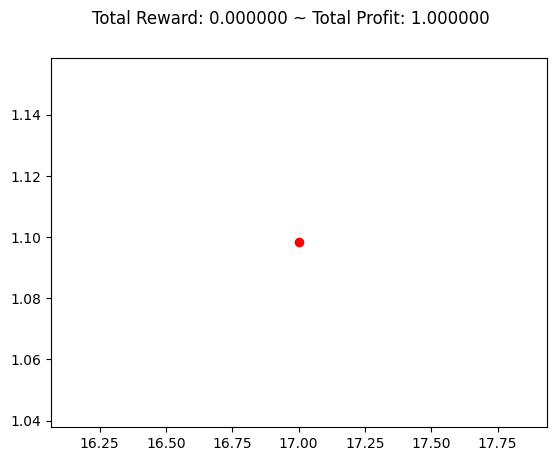

...

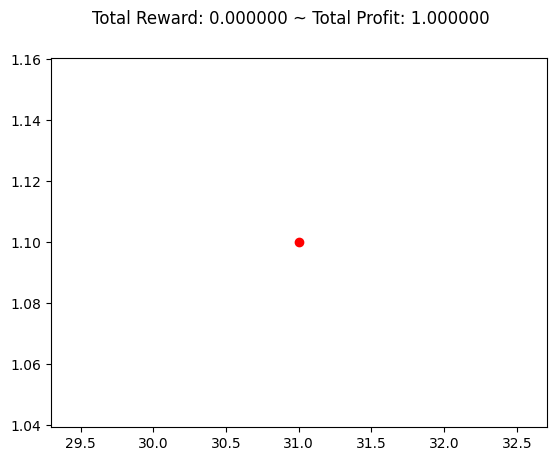

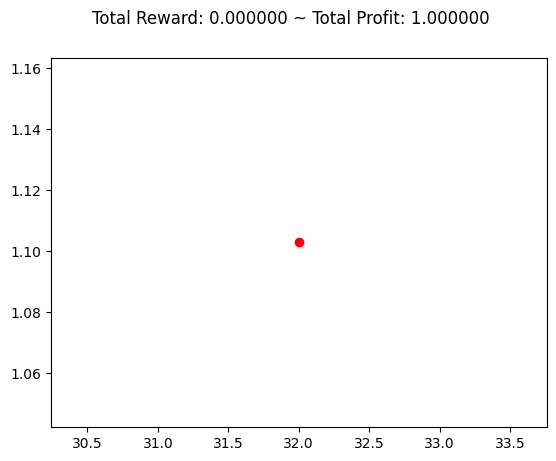

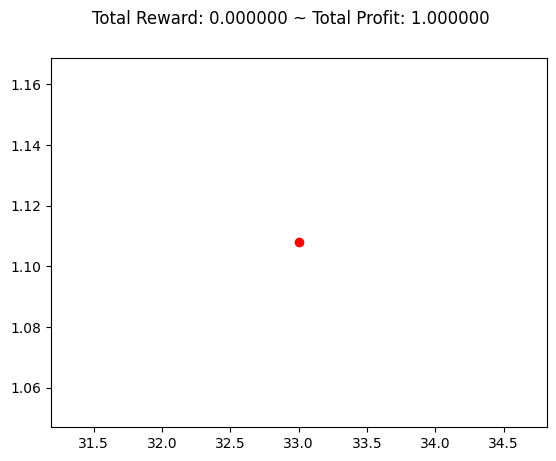

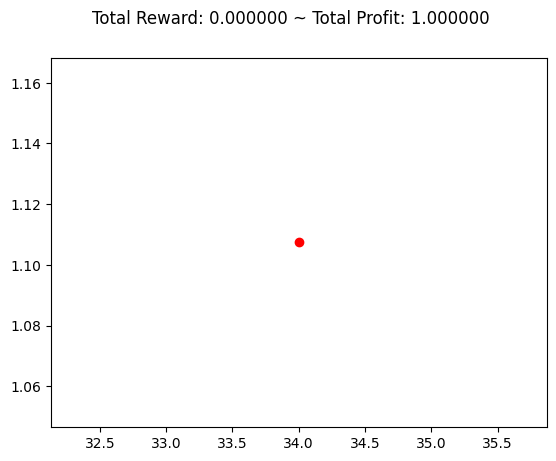

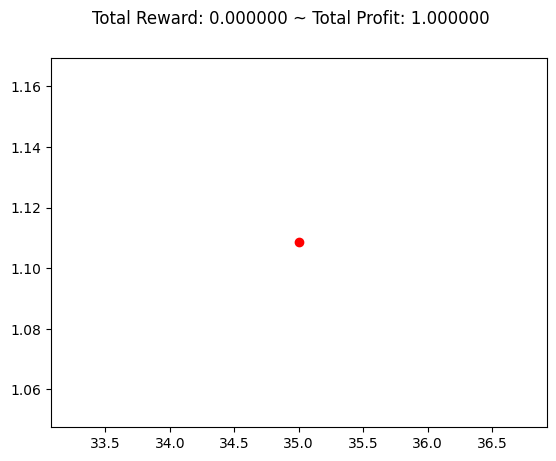

buy 


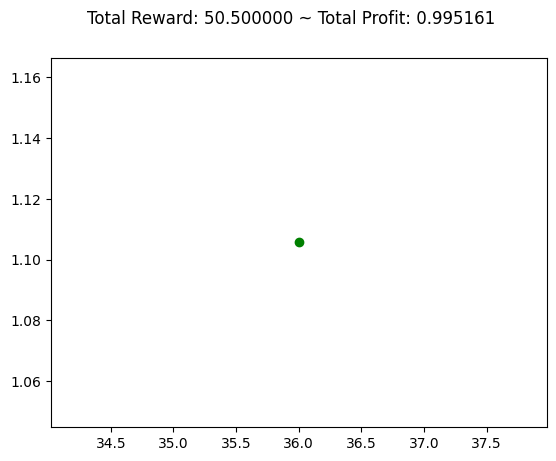

sell 


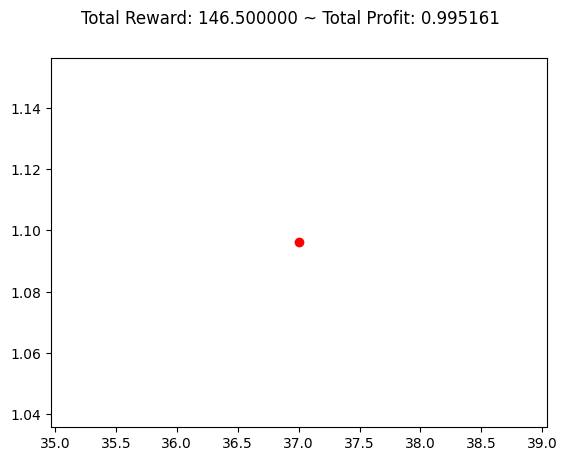

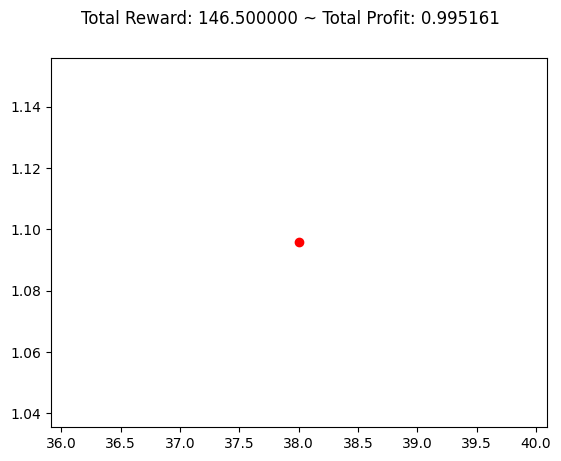

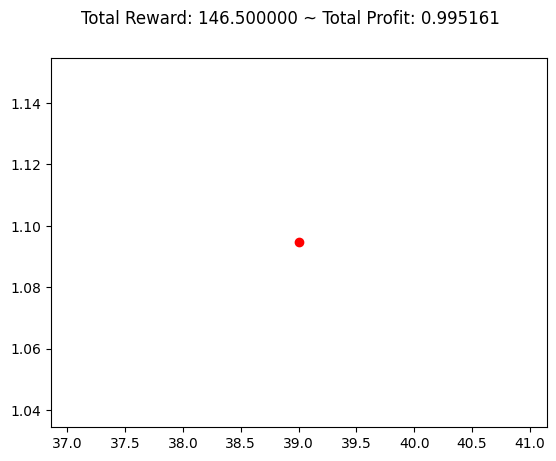

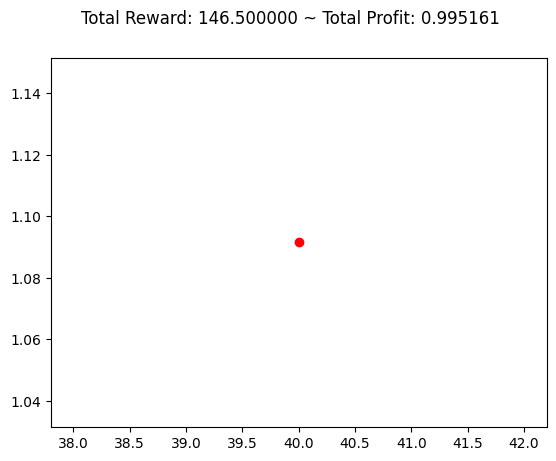

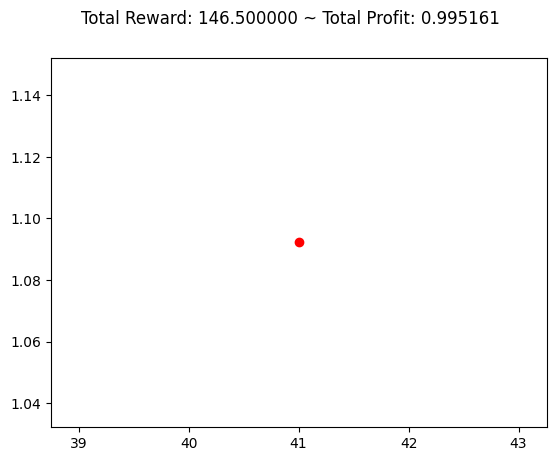

...

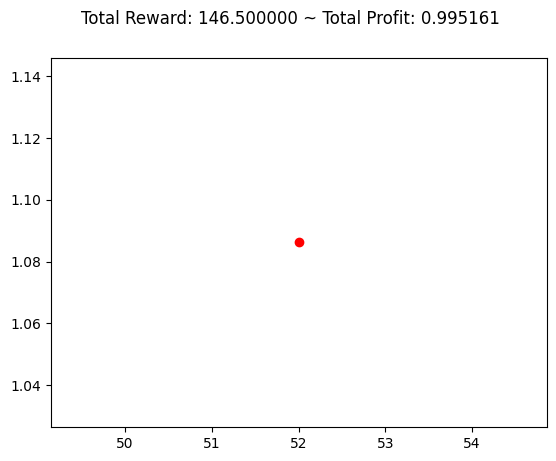

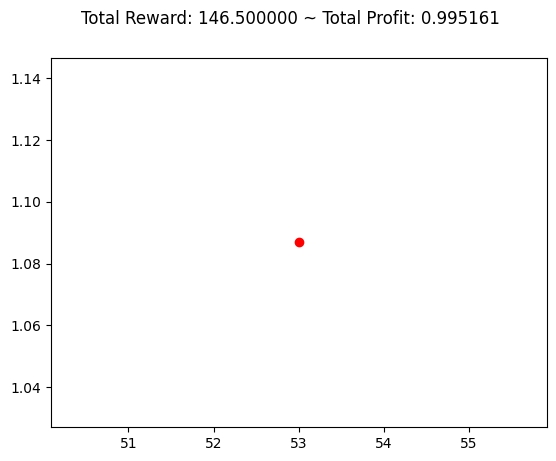

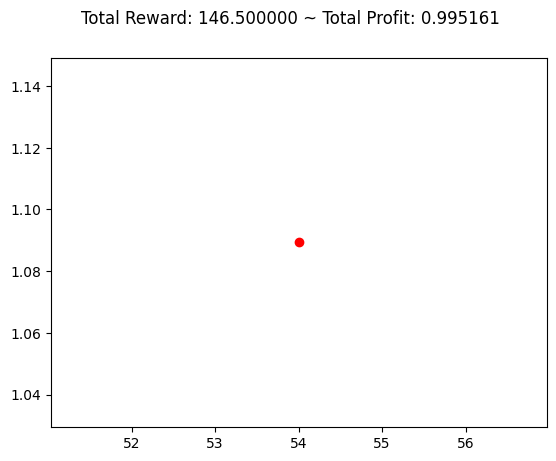

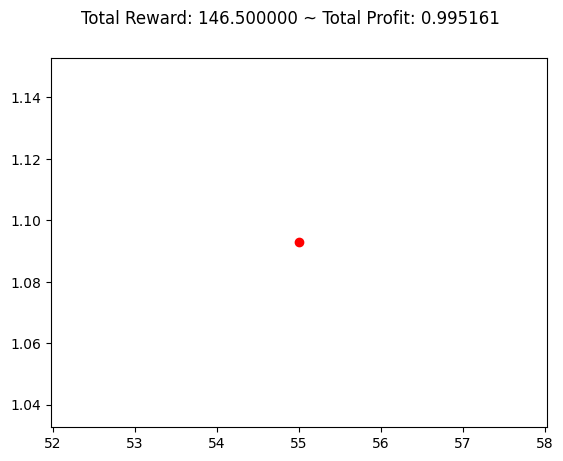

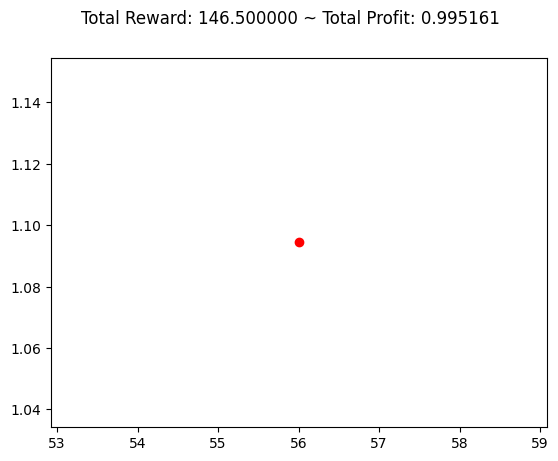

buy 


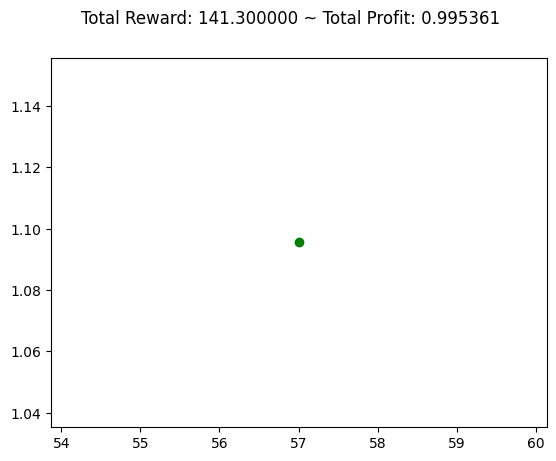

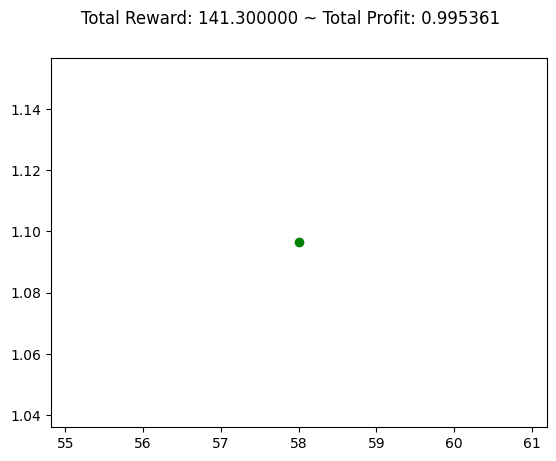

sell 


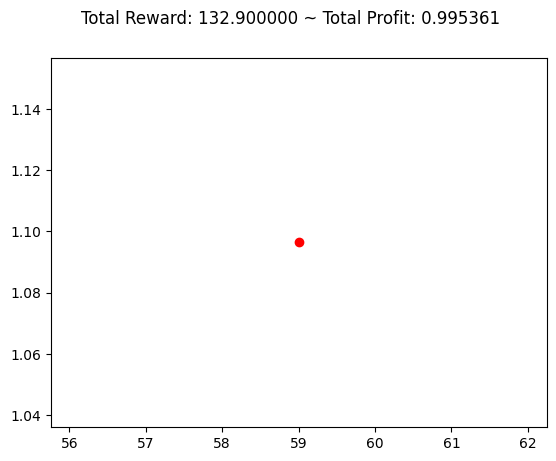

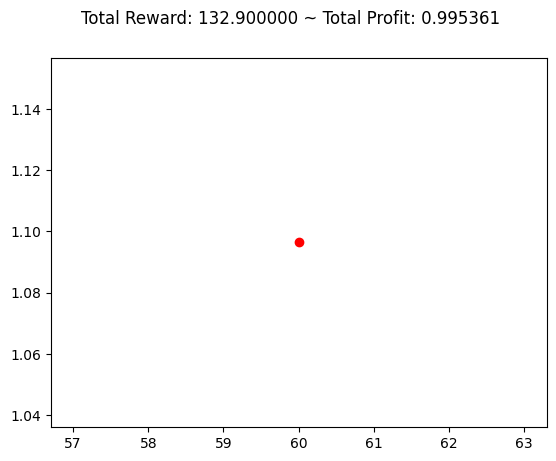

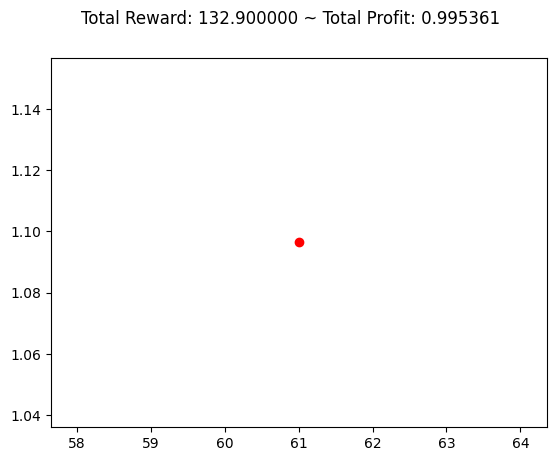

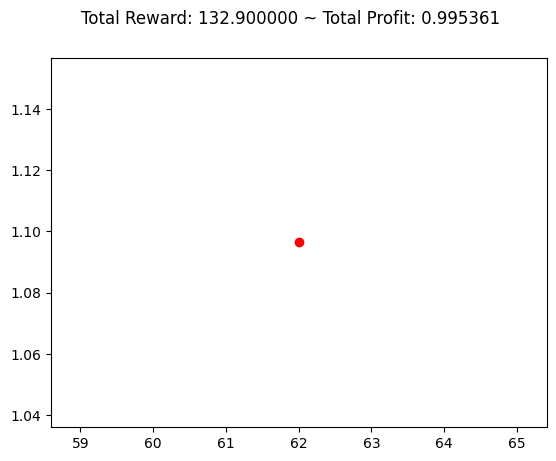

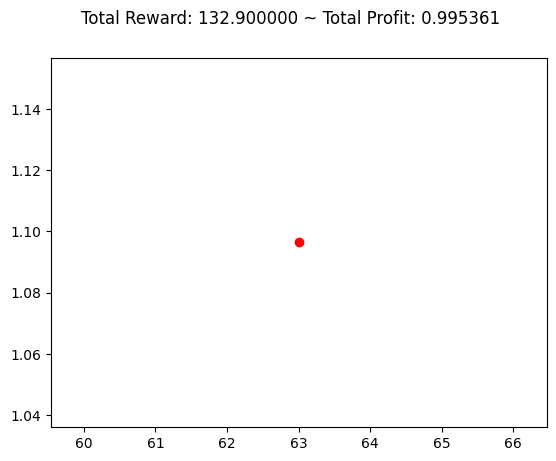

...

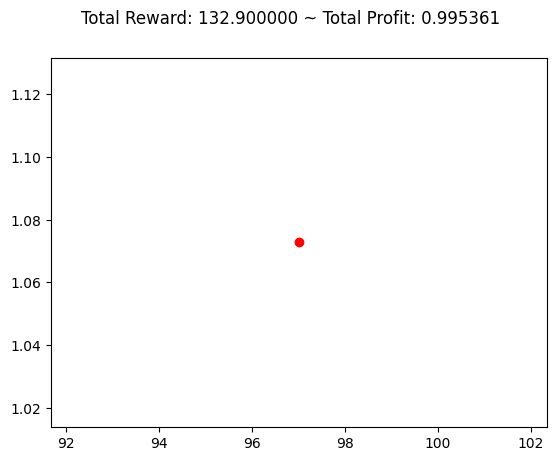

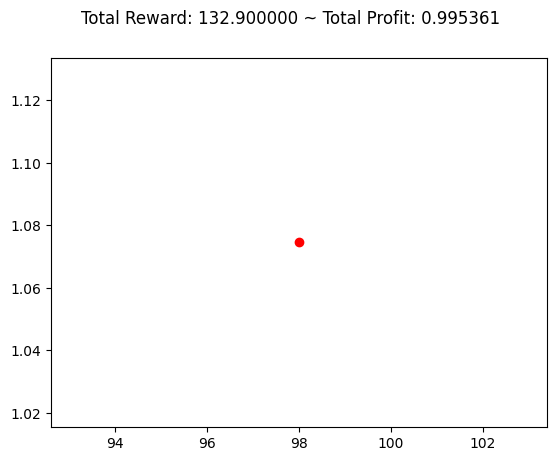

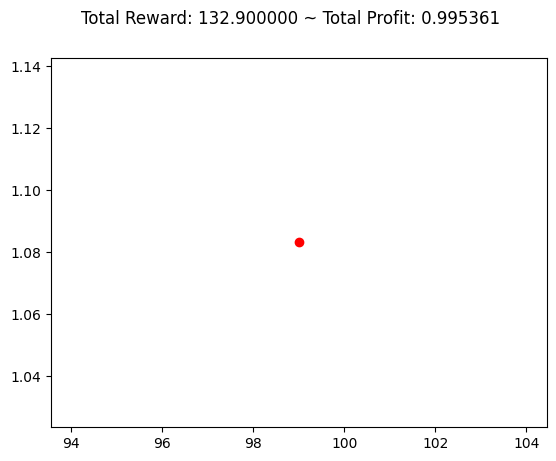

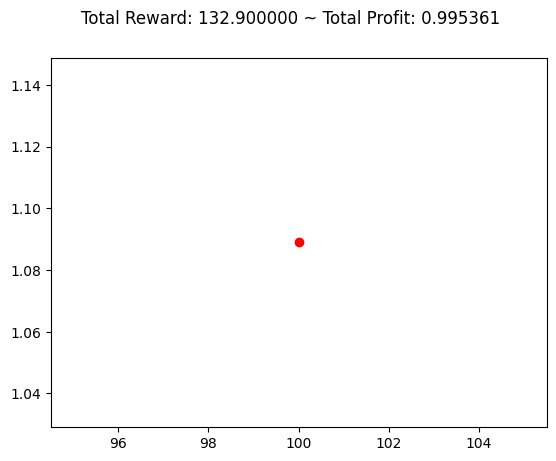

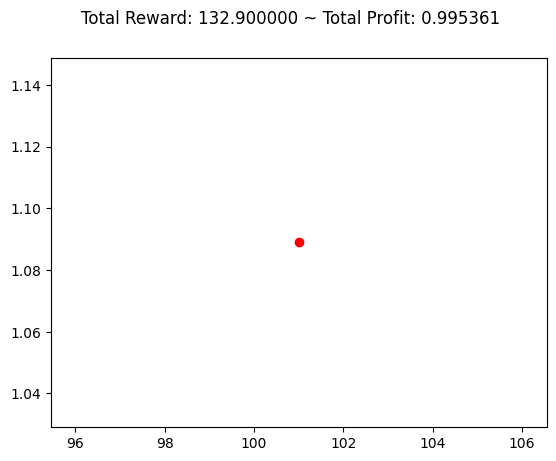

buy 


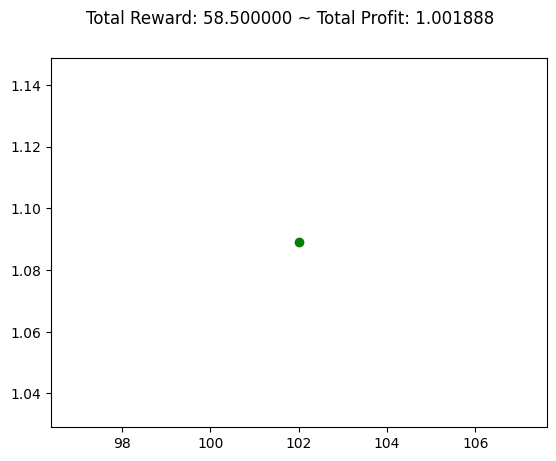

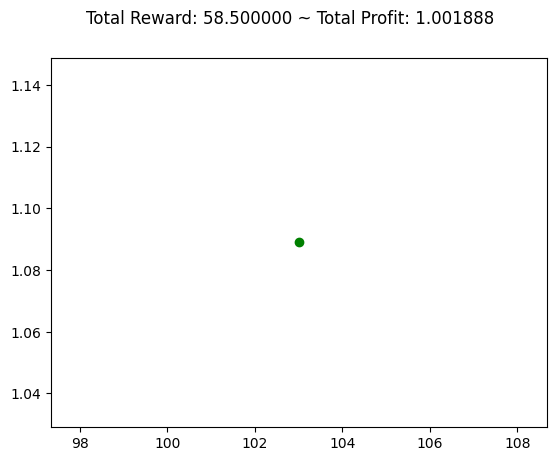

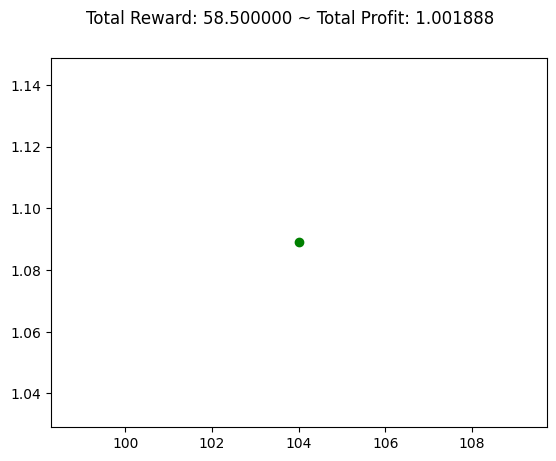

sell 


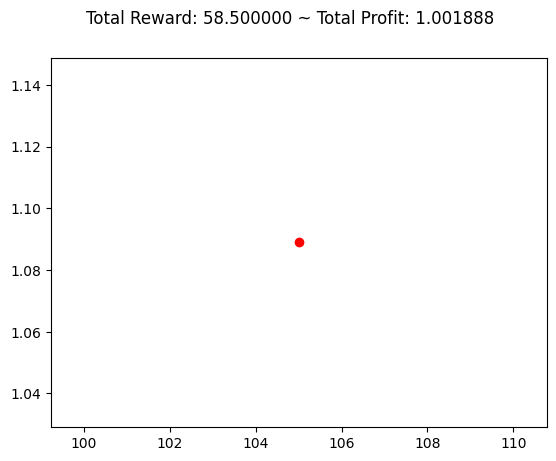

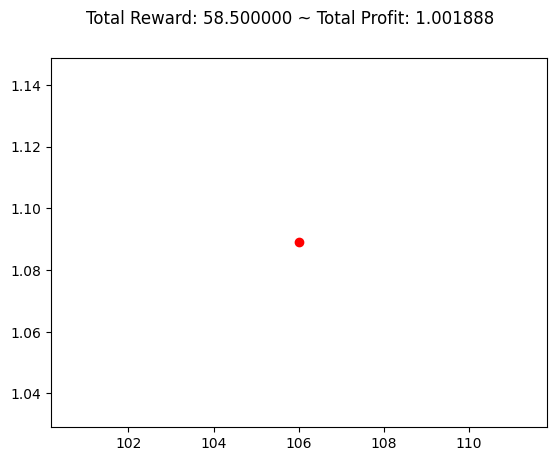

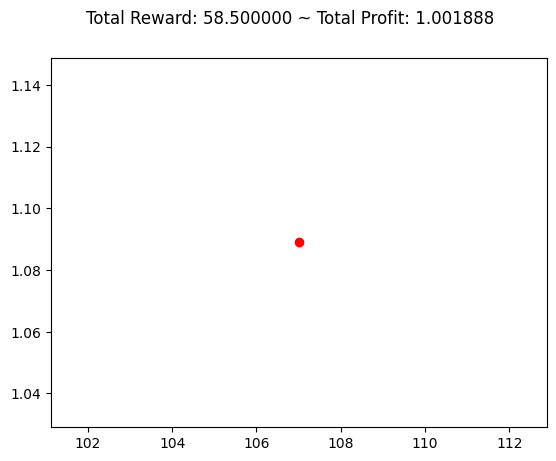

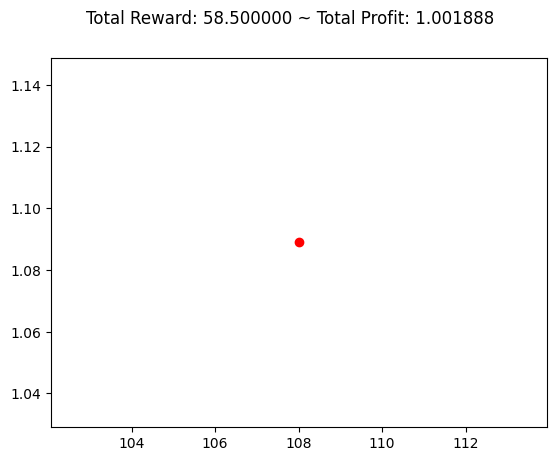

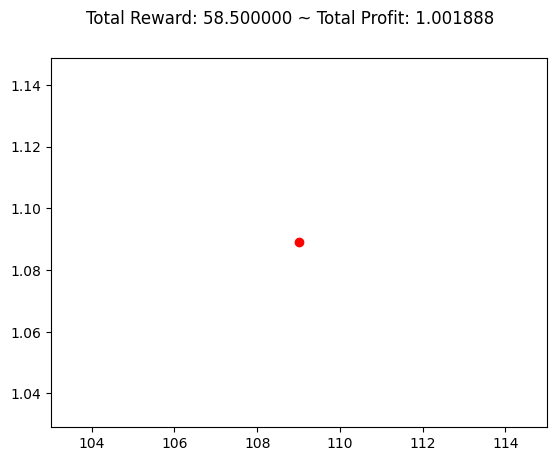

...

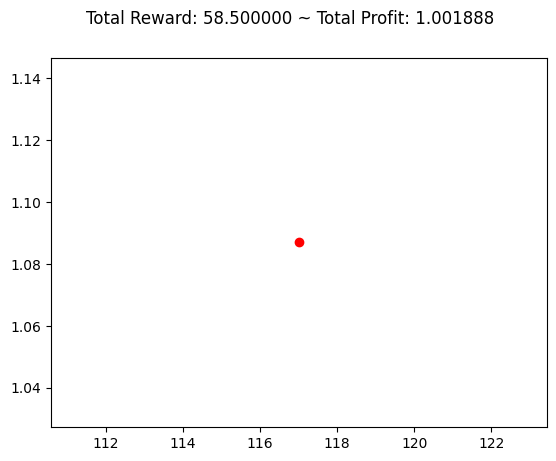

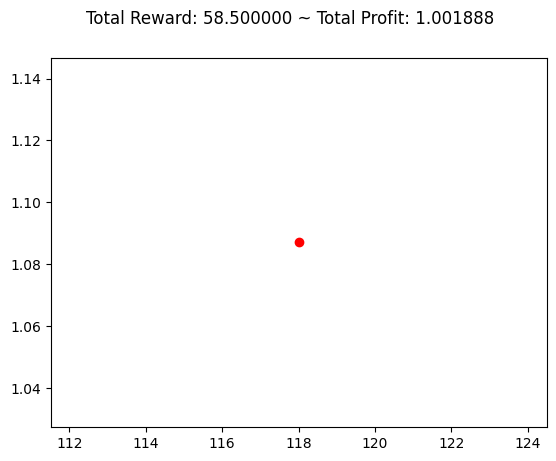

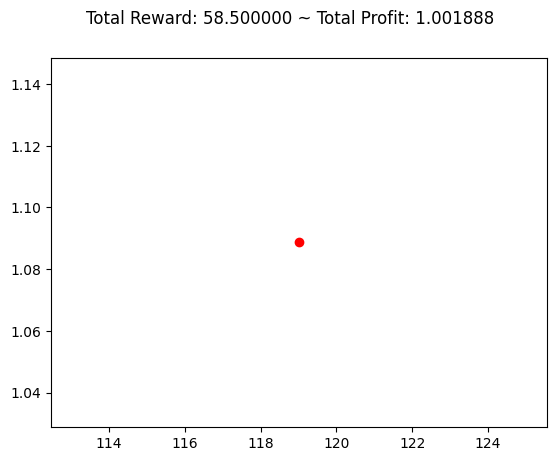

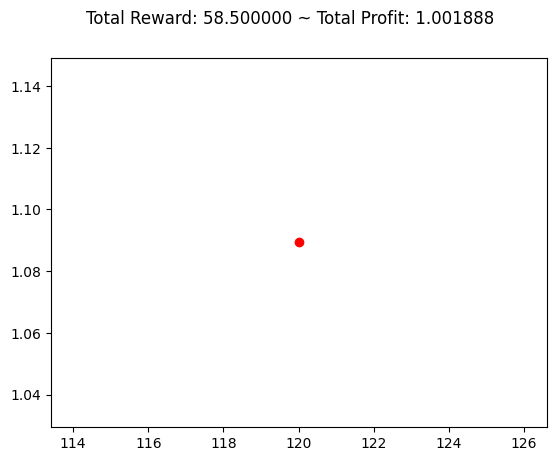

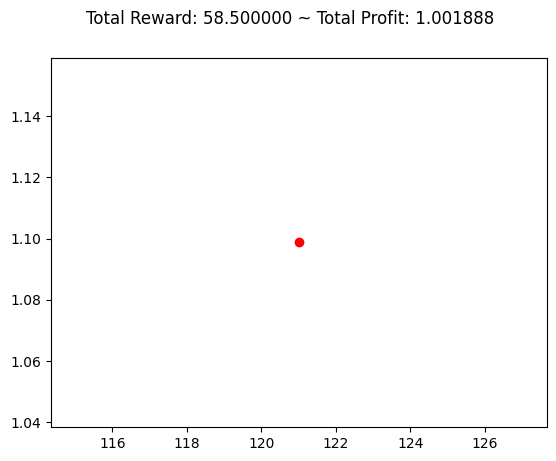

buy 


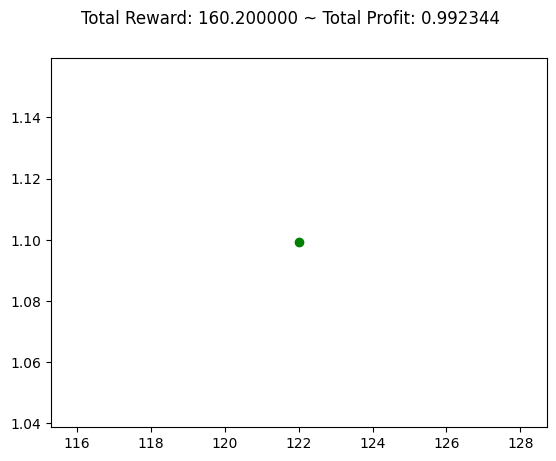

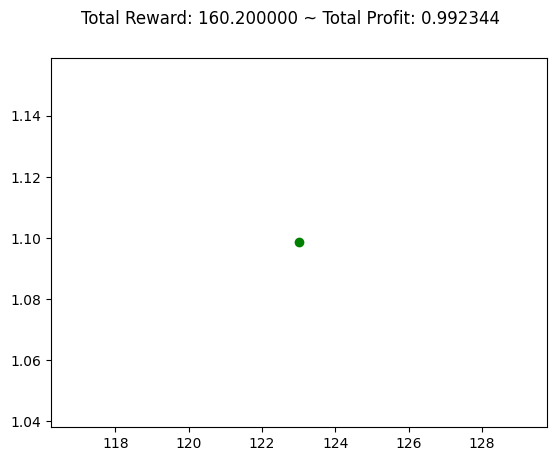

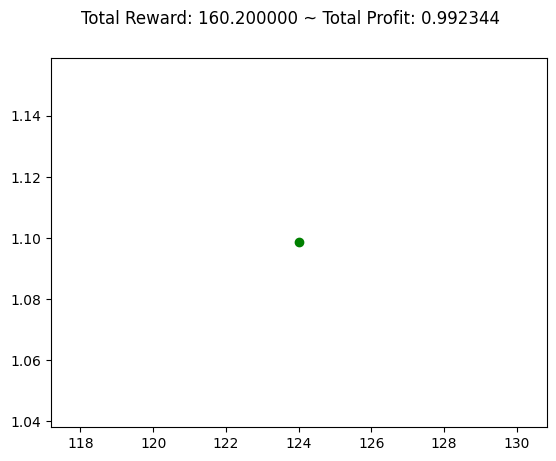

sell 


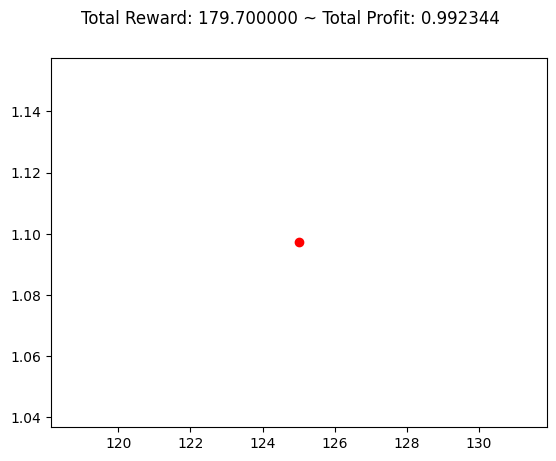

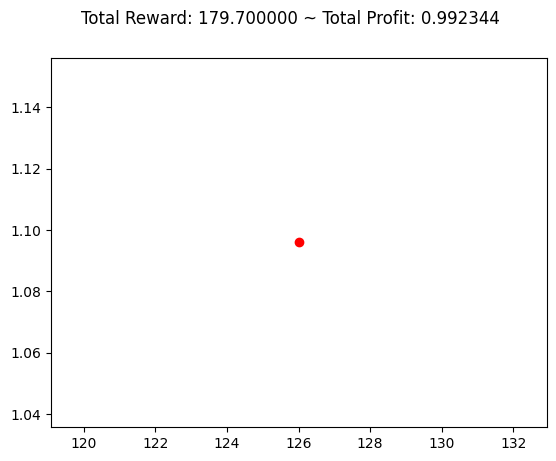

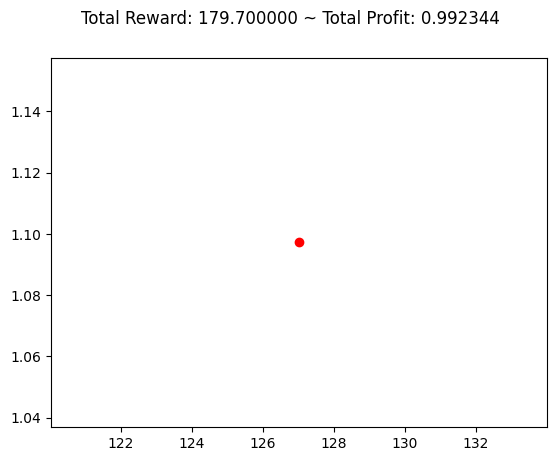

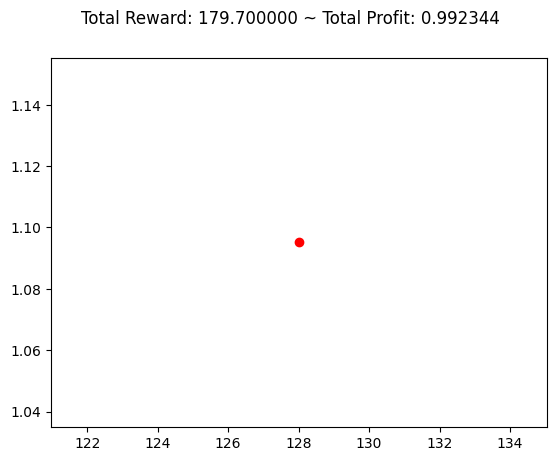

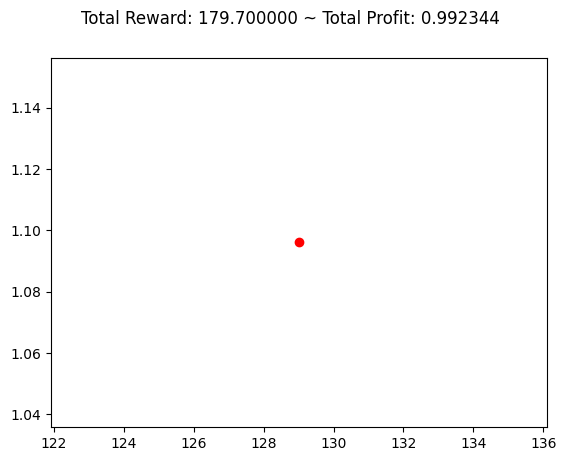

...

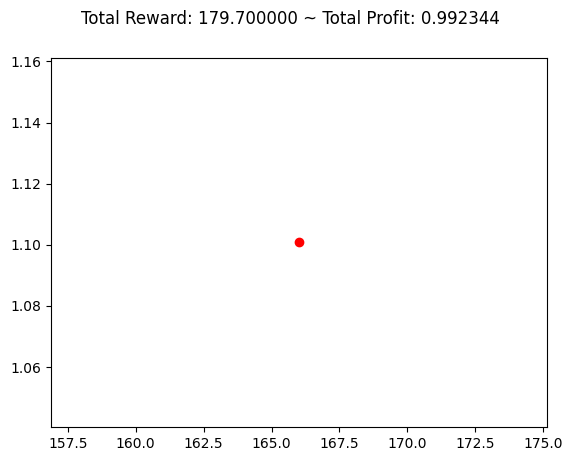

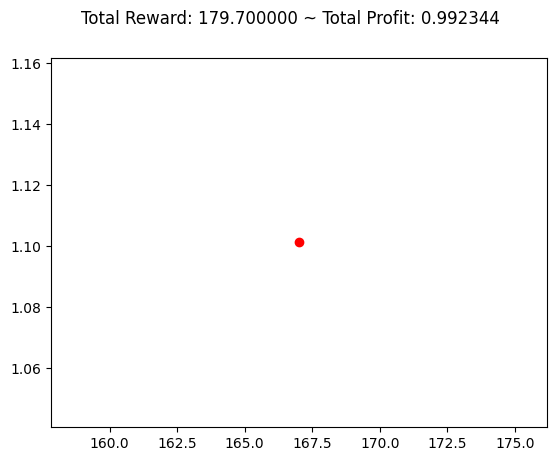

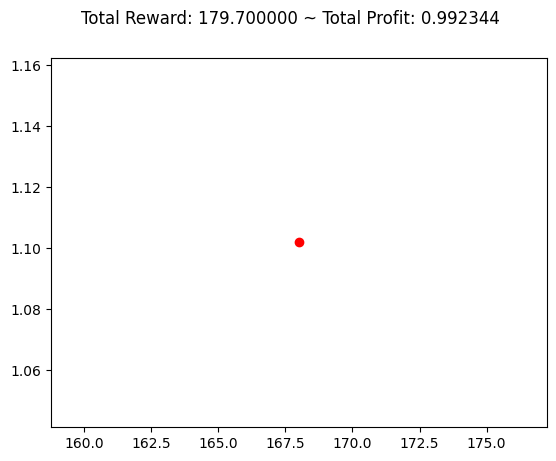

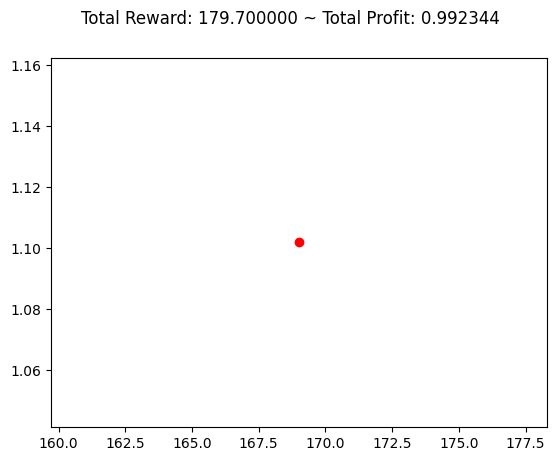

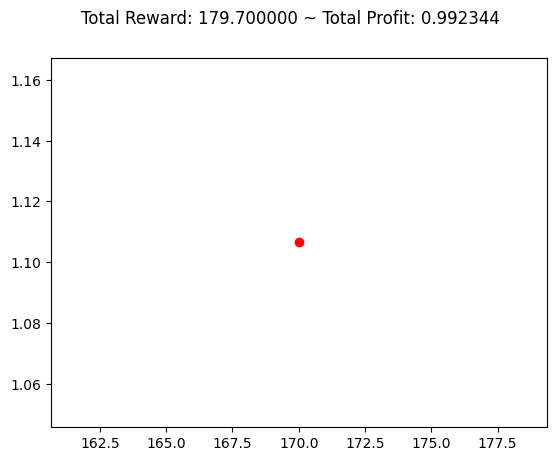

buy 


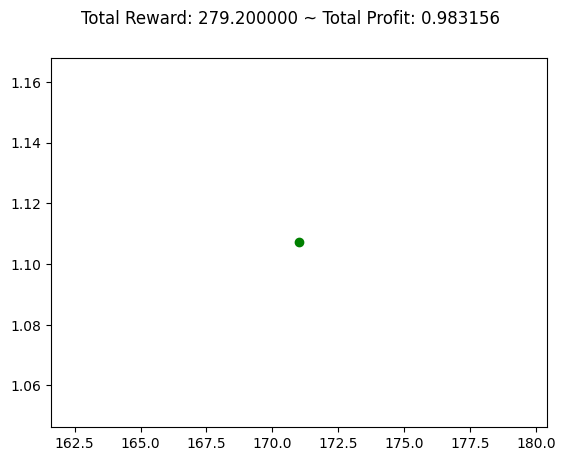

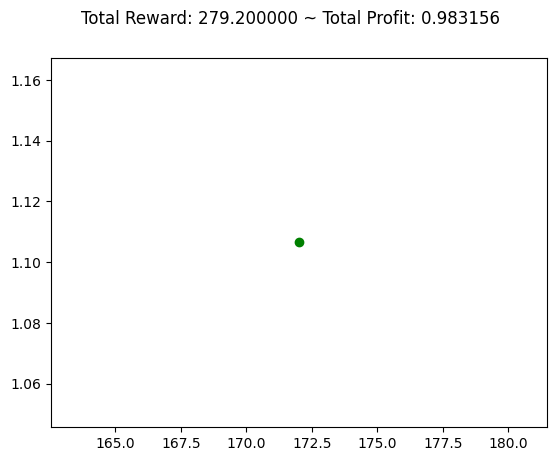

sell 


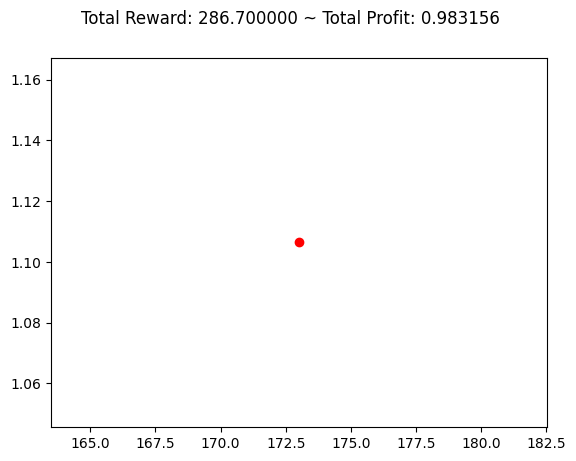

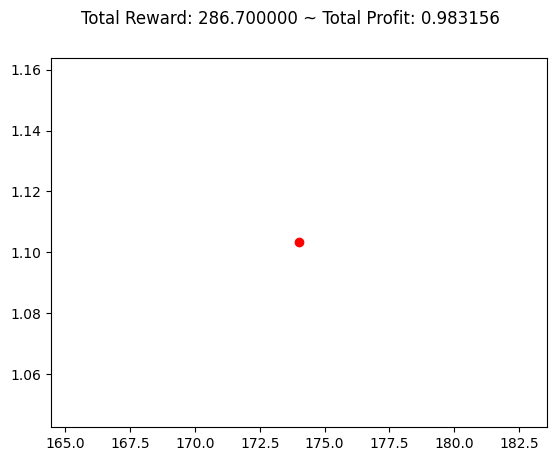

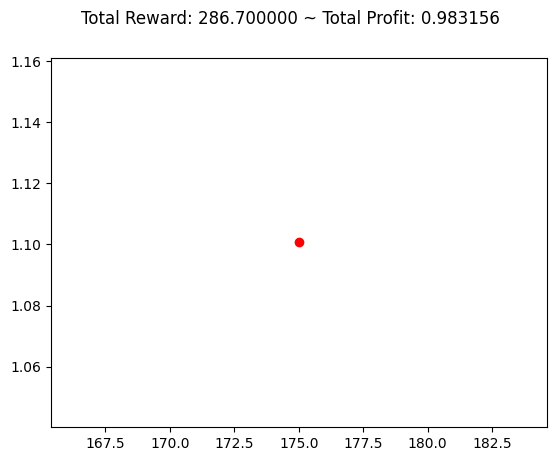

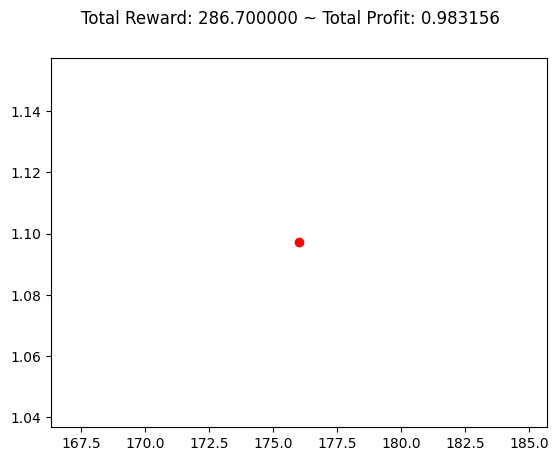

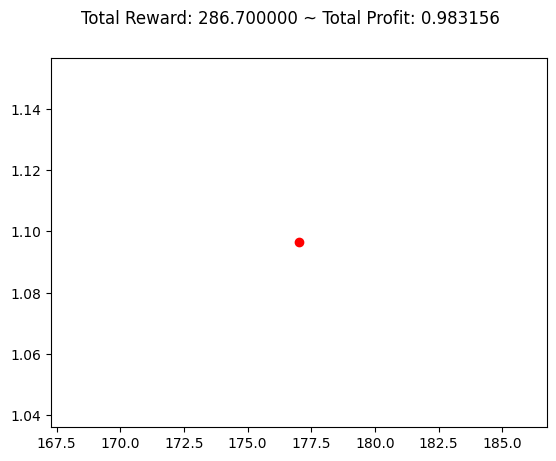

...

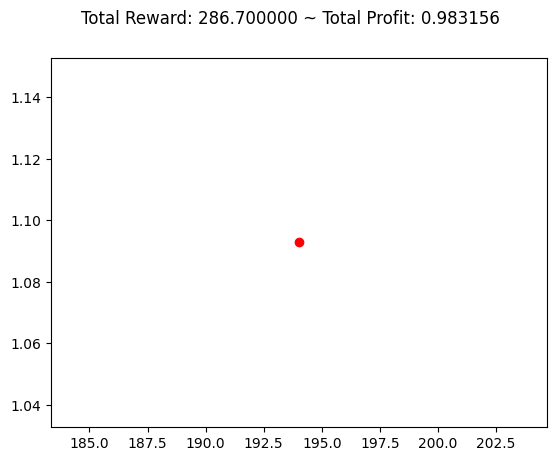

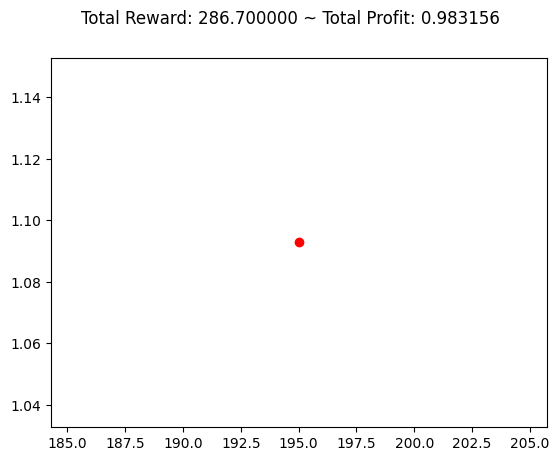

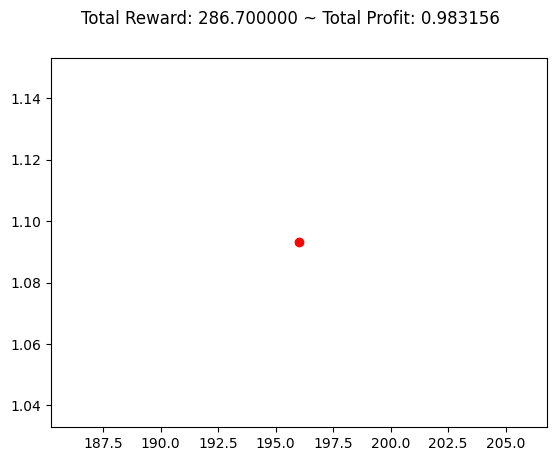

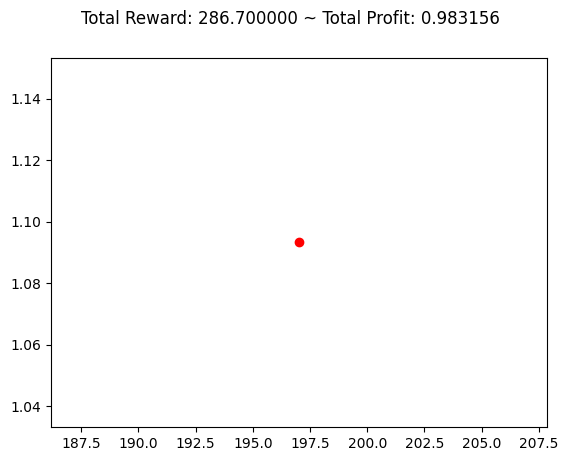

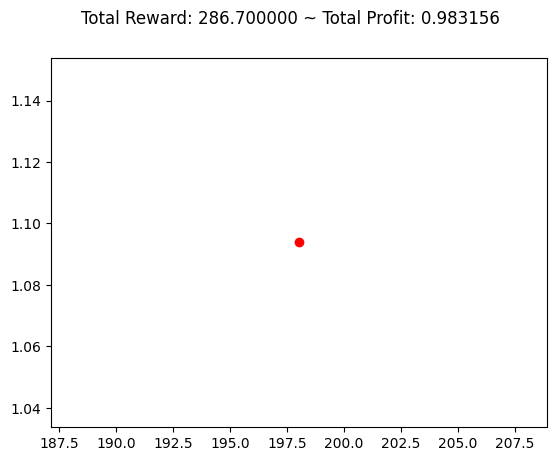

buy 


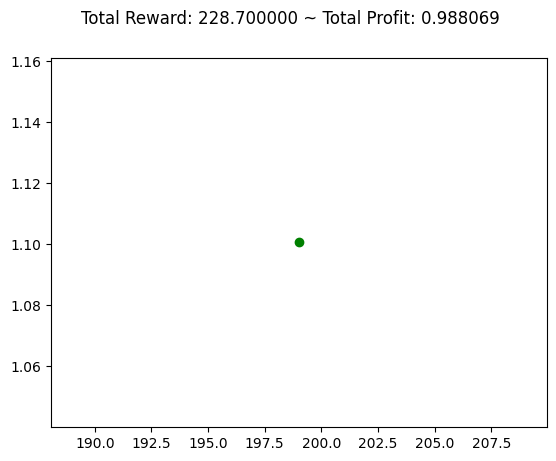

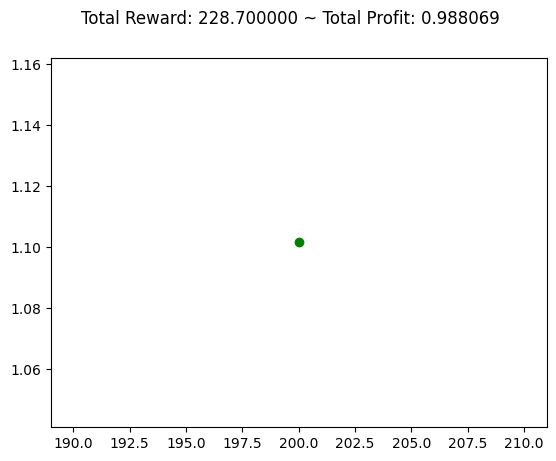

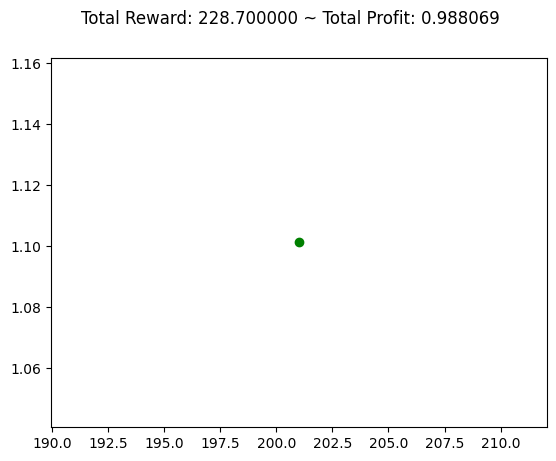

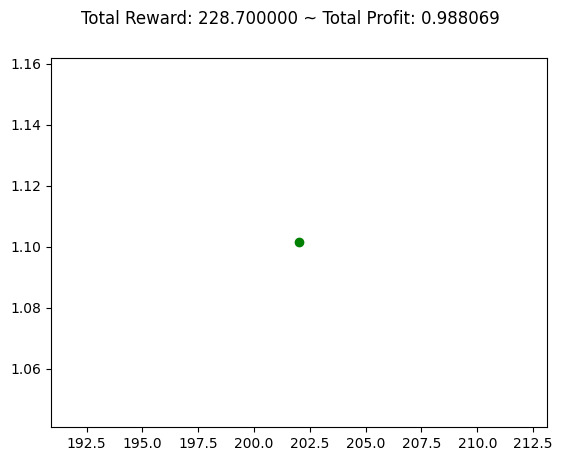

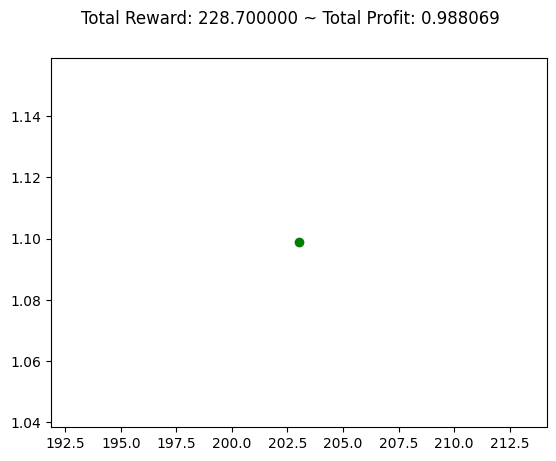

sell 


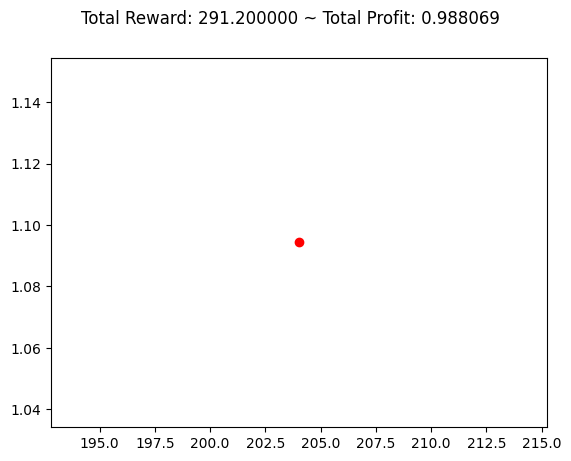

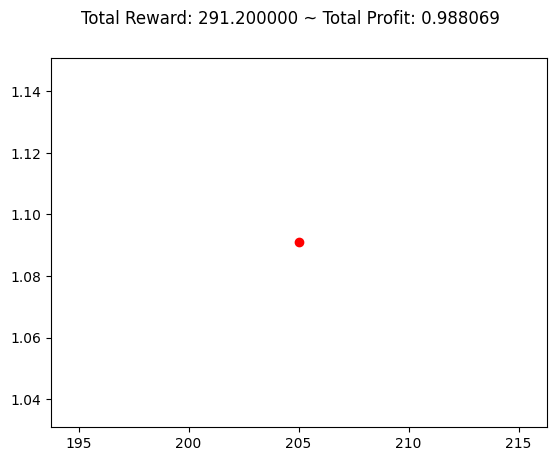

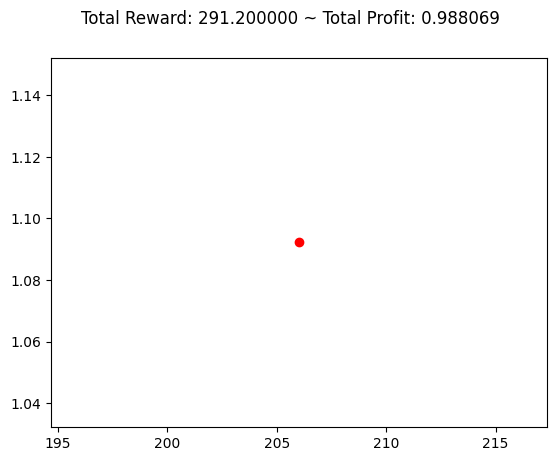

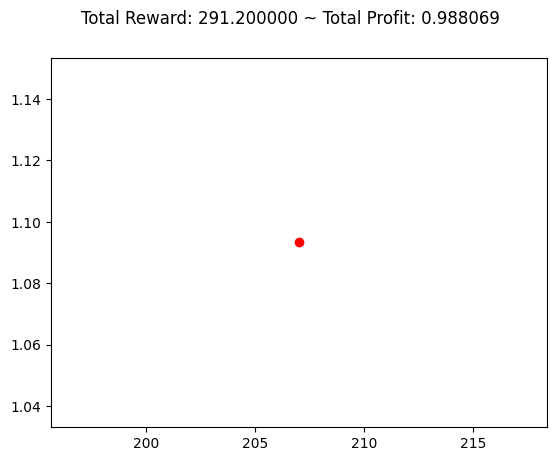

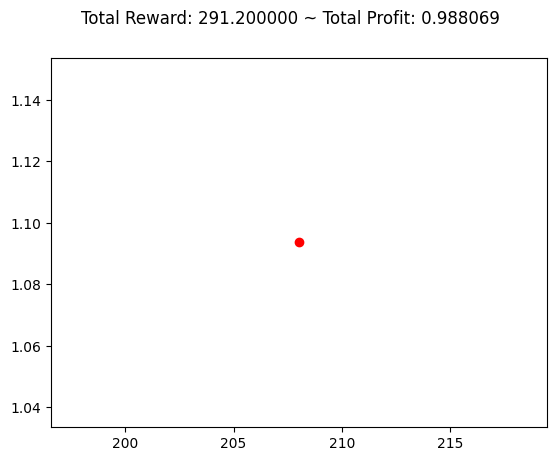

...

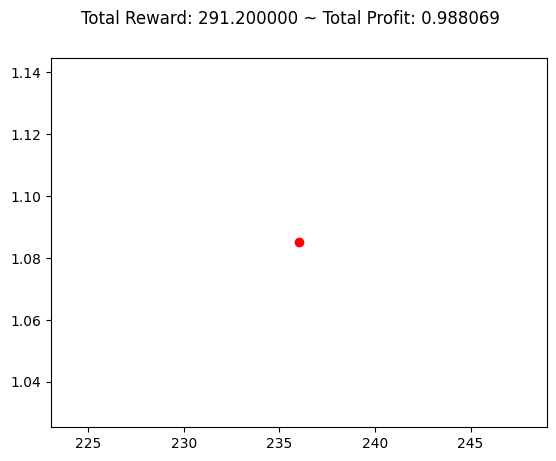

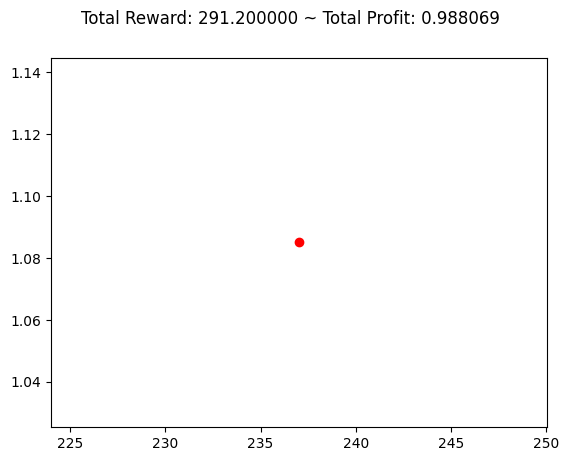

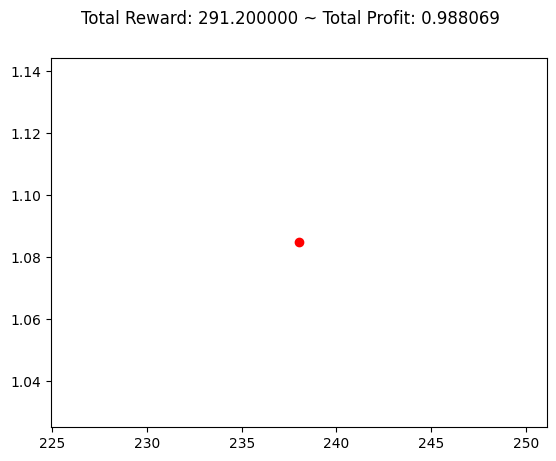

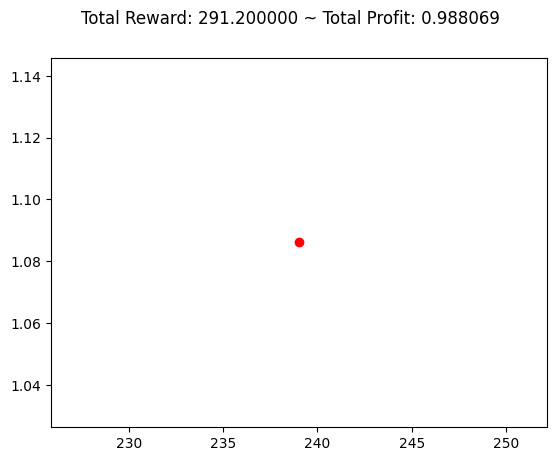

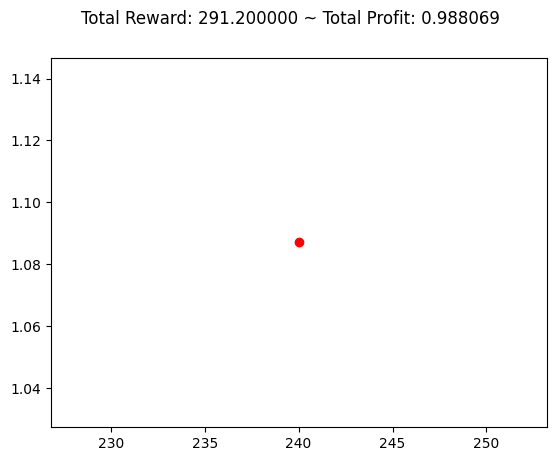

buy 


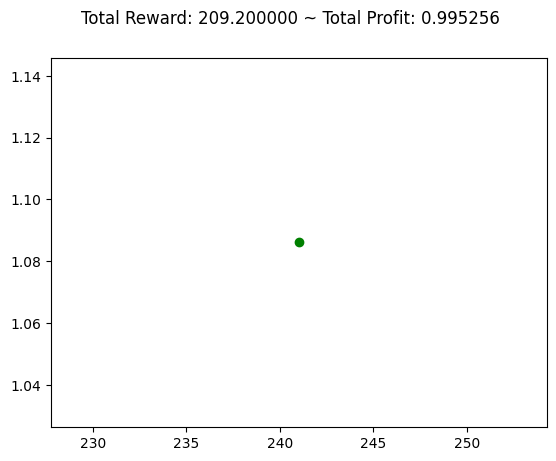

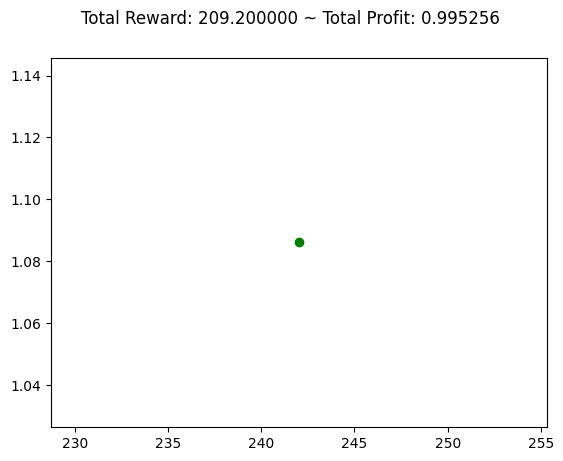

sell 


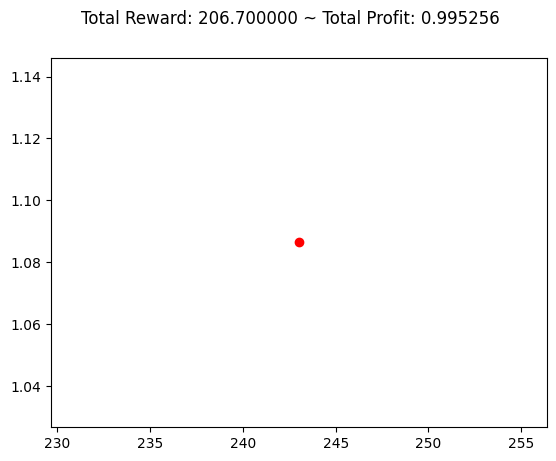

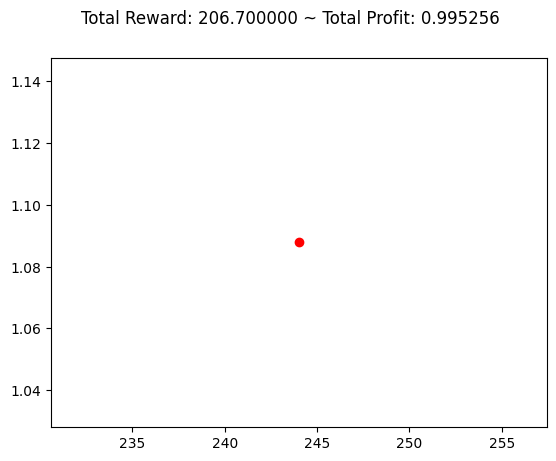

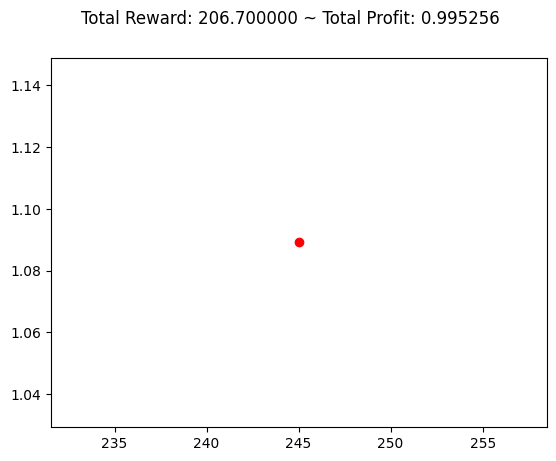

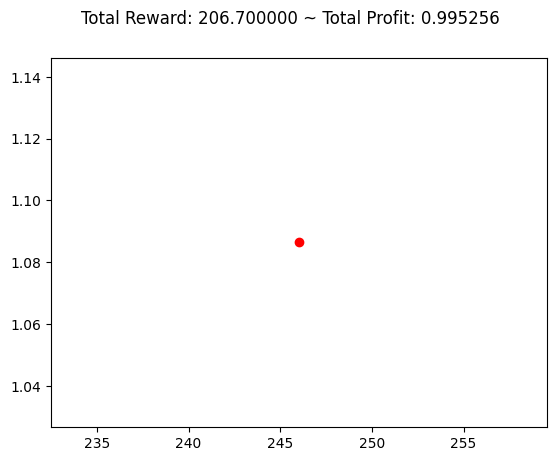

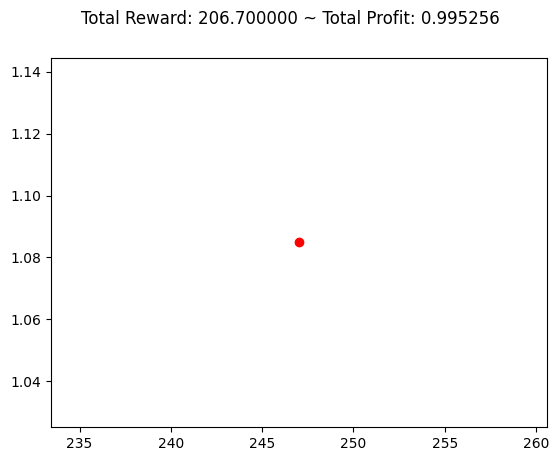

...

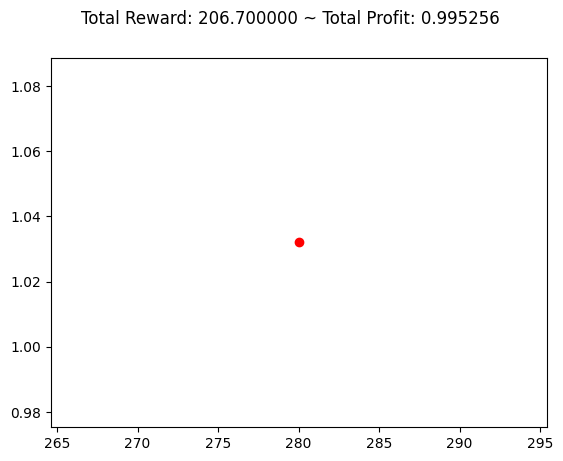

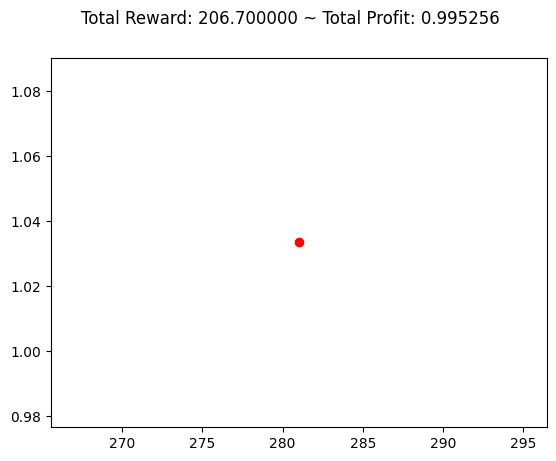

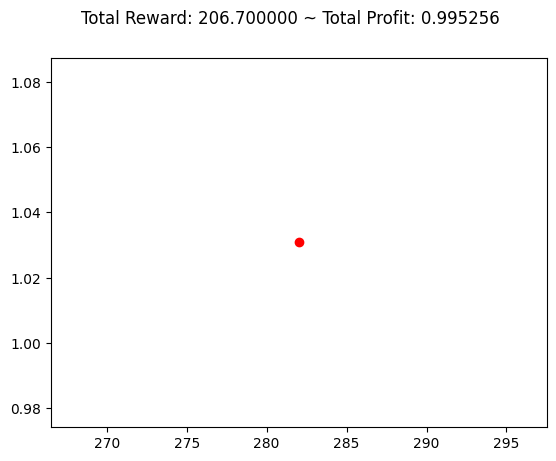

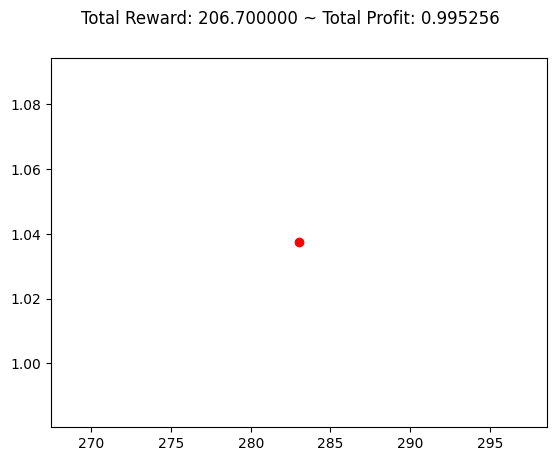

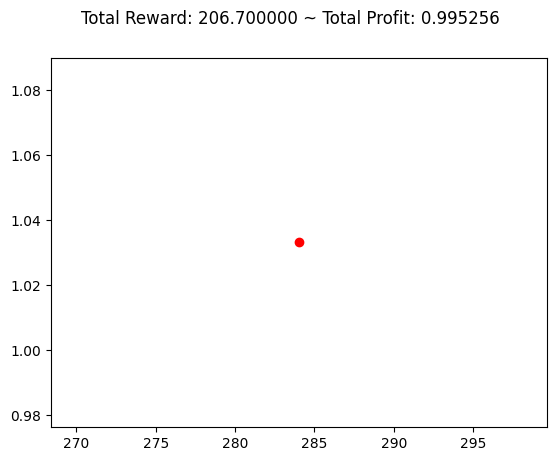

buy 


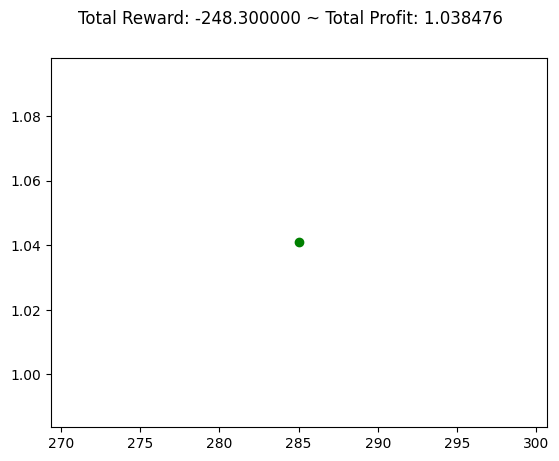

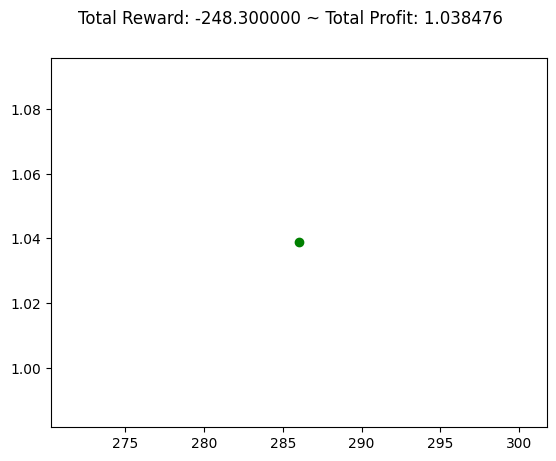

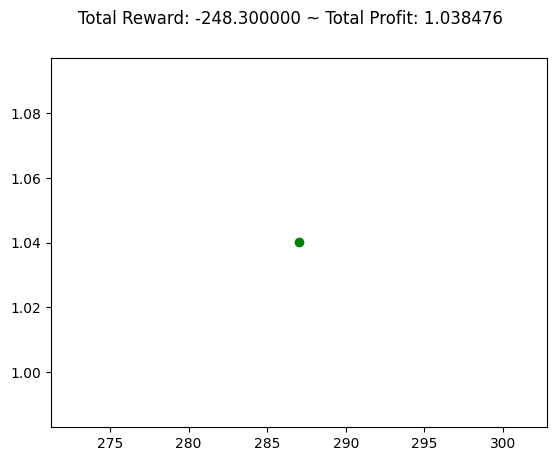

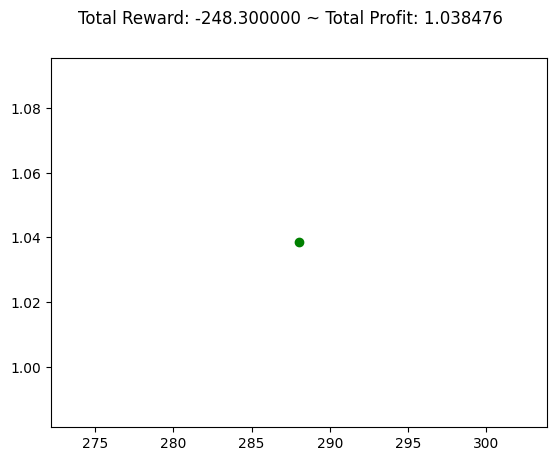

sell 


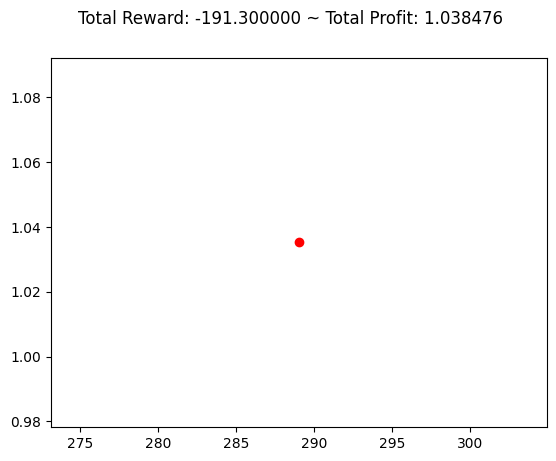

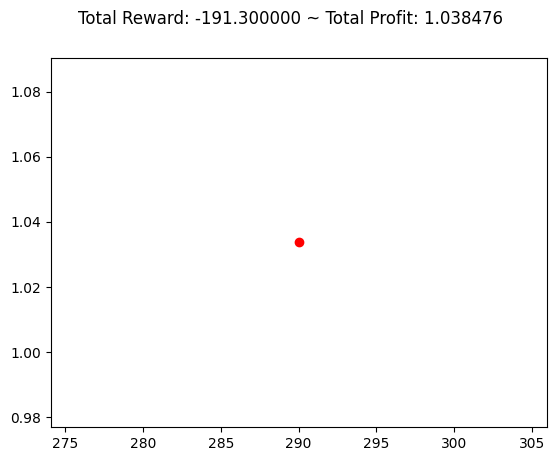

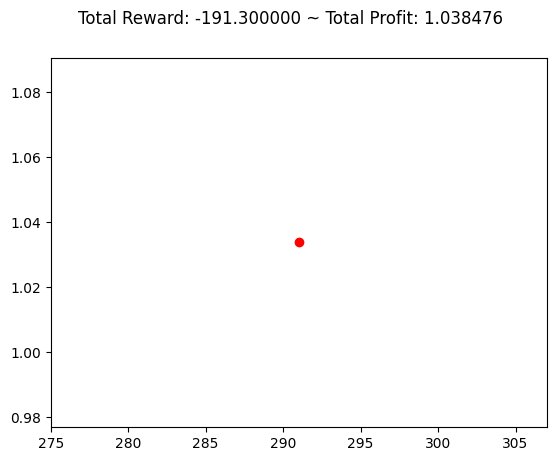

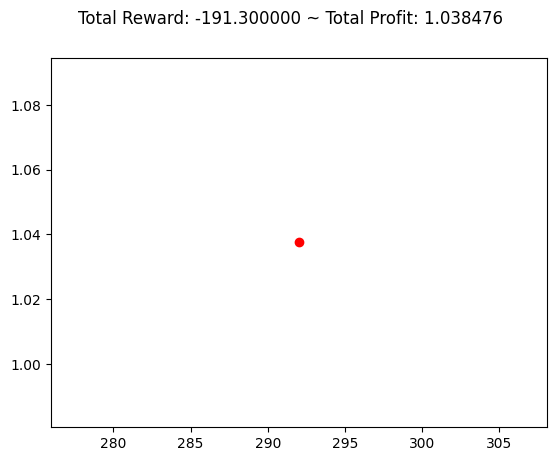

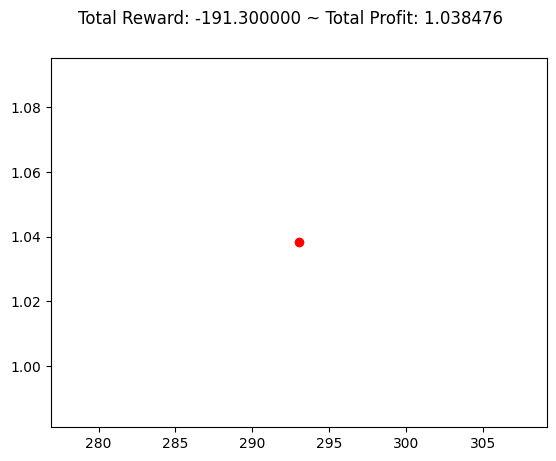

buy 


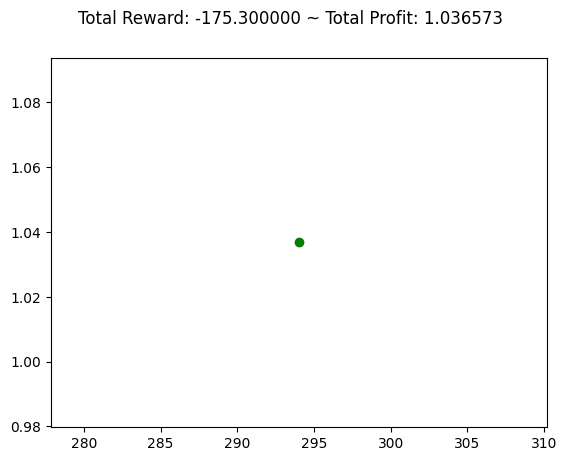

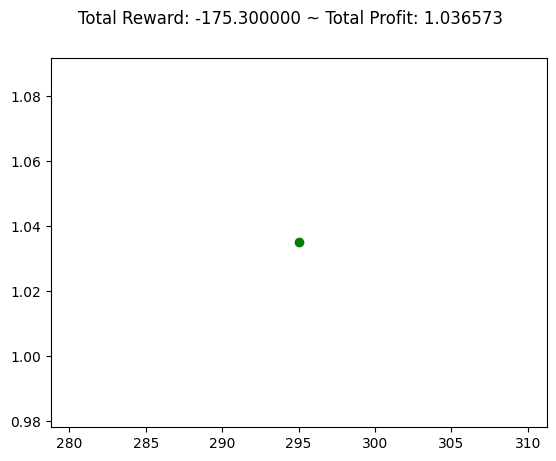

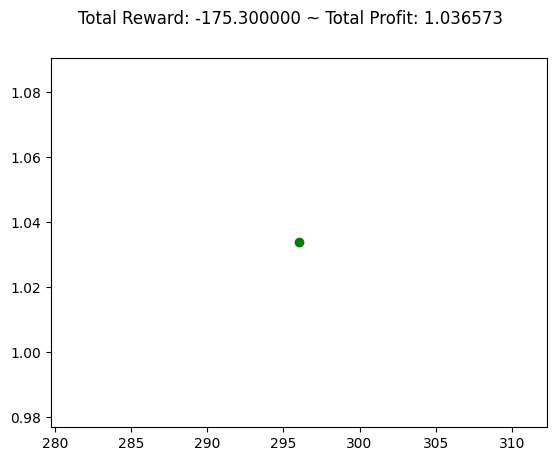

sell 


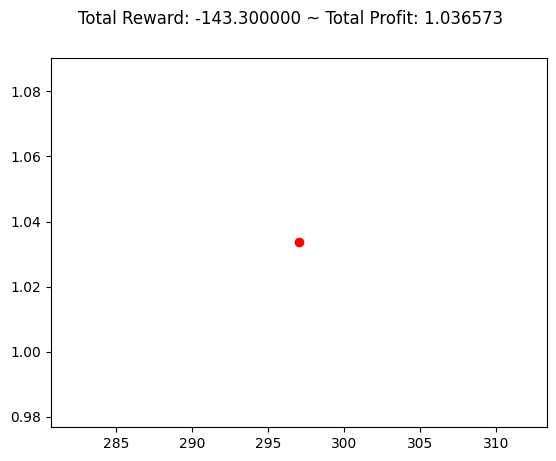

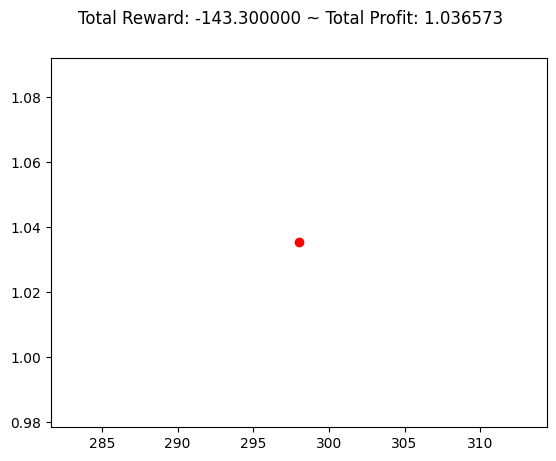

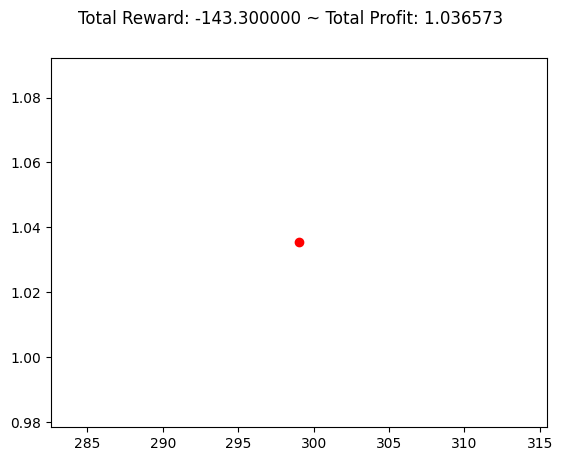

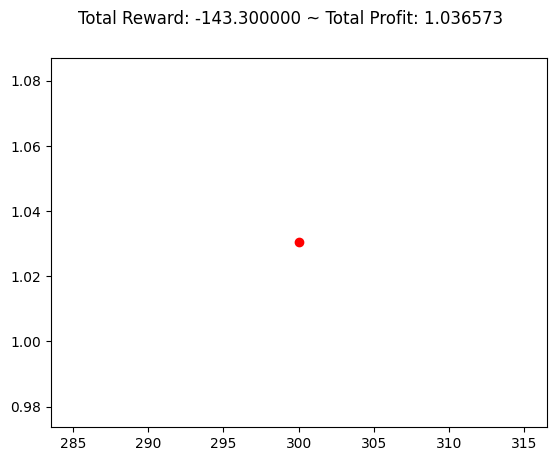

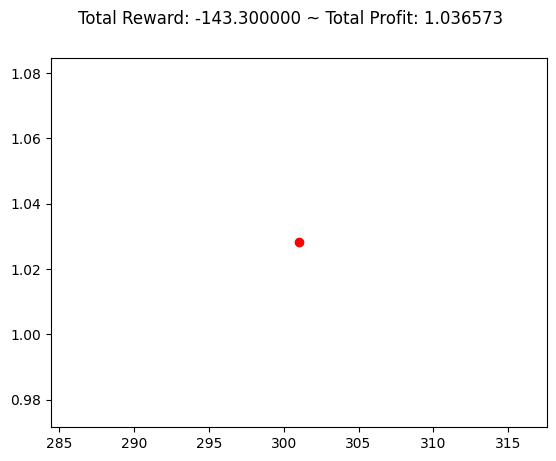

...

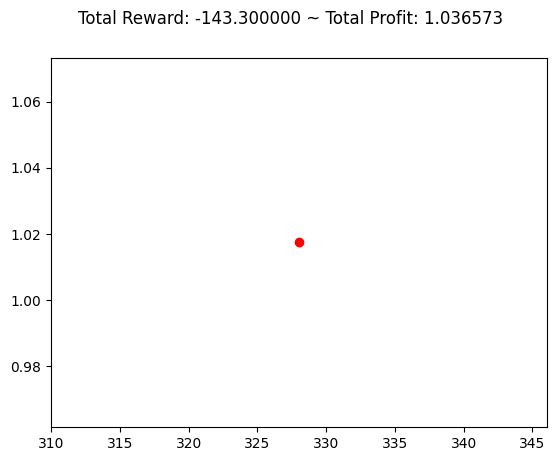

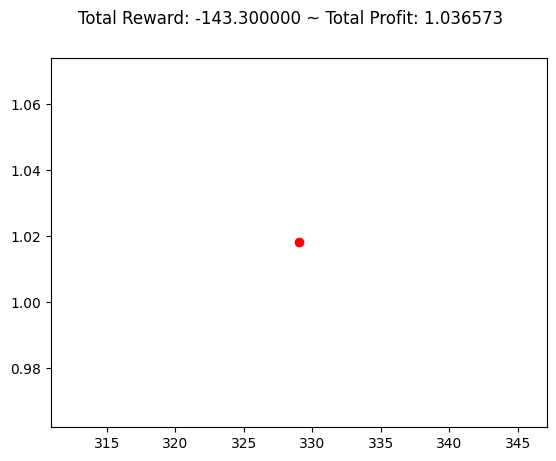

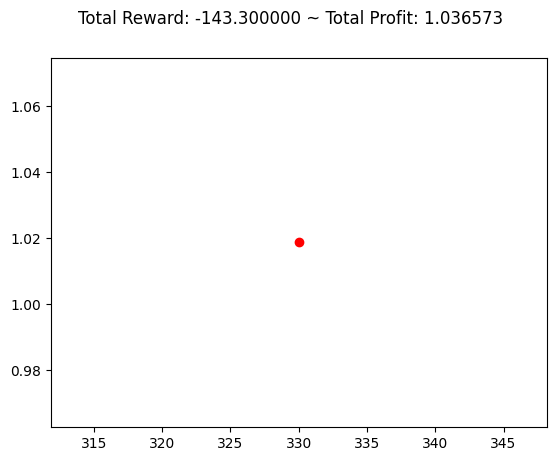

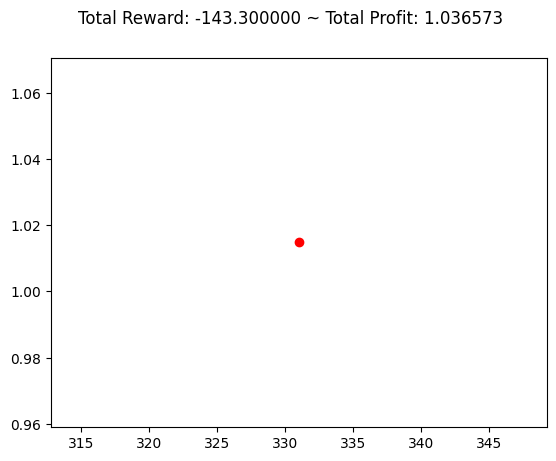

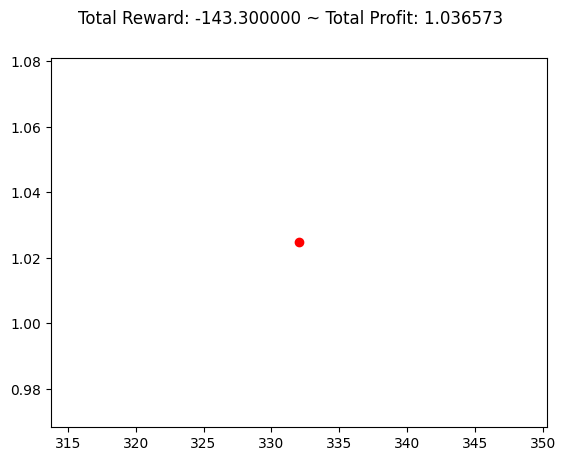

buy 


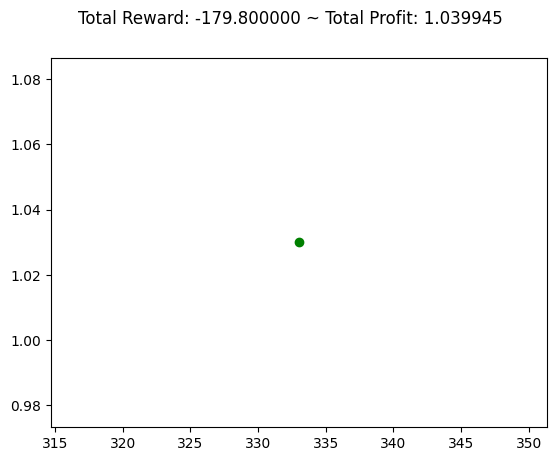

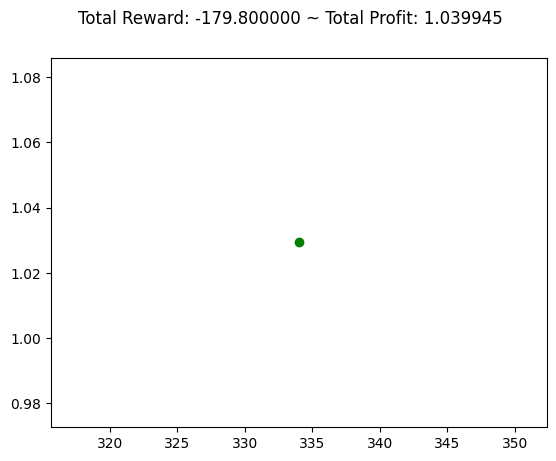

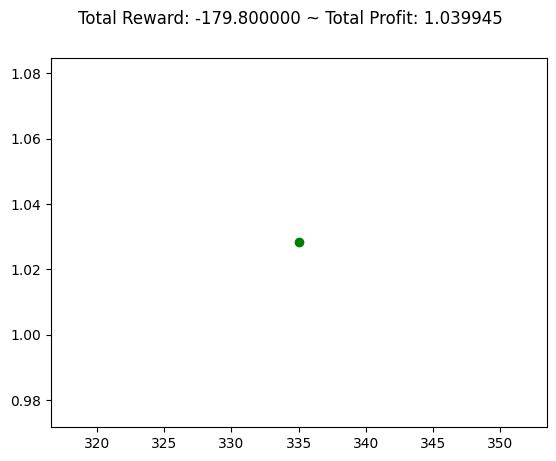

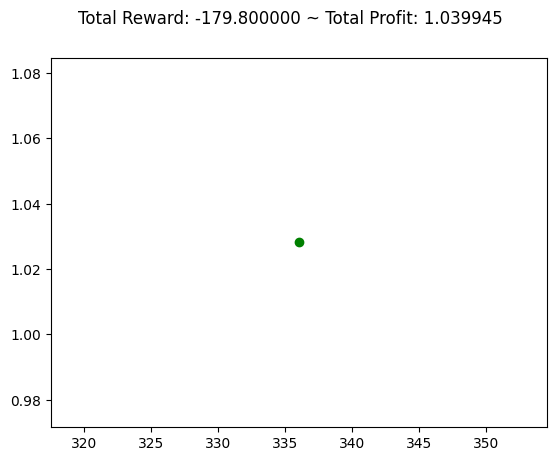

sell 


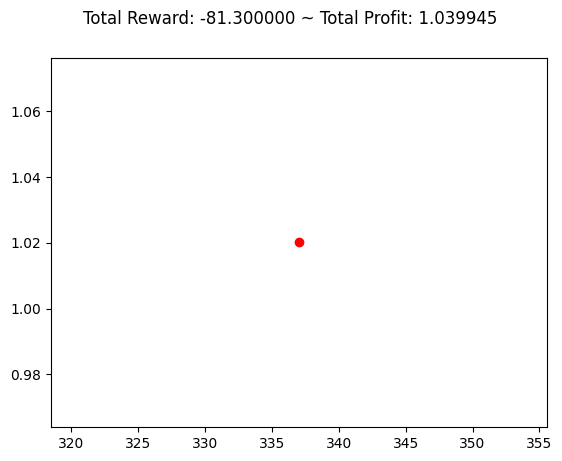

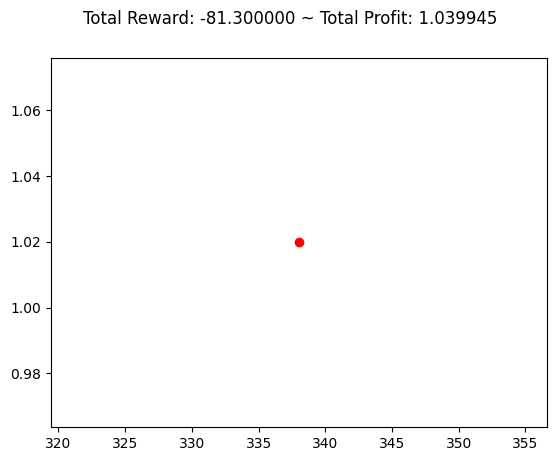

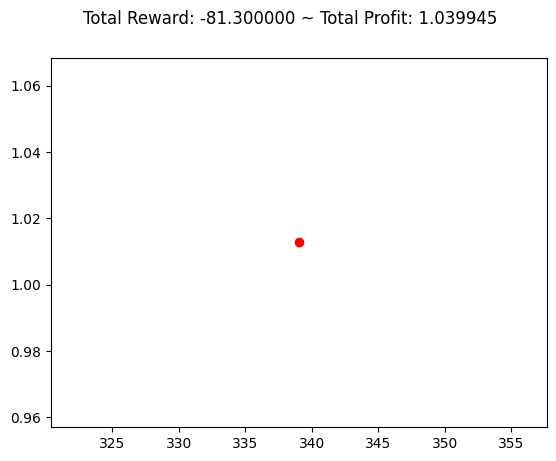

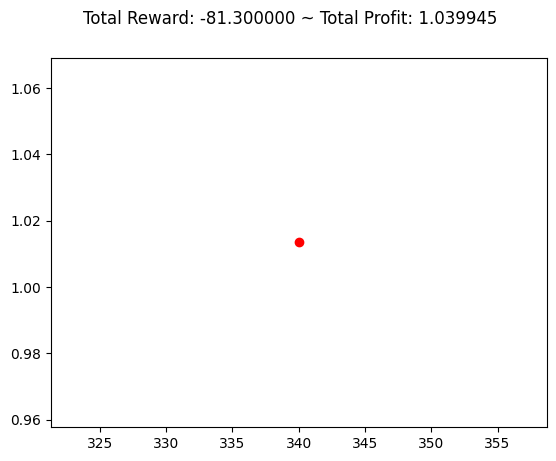

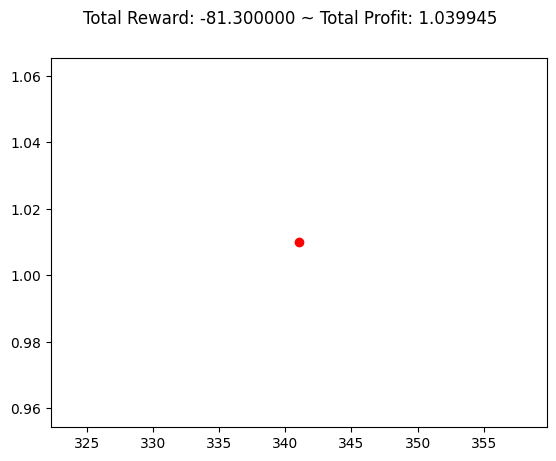

...

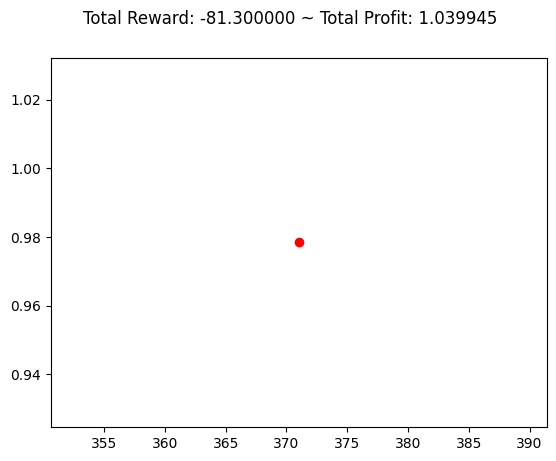

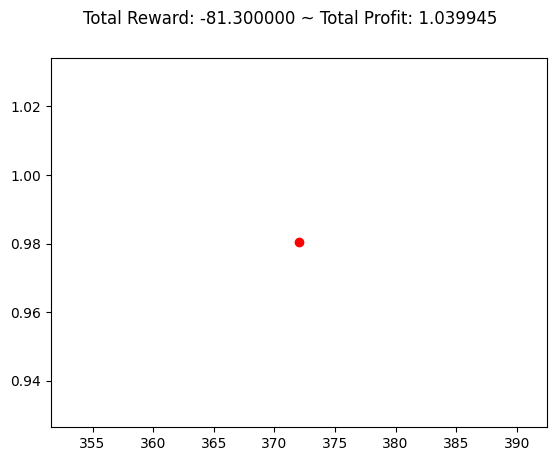

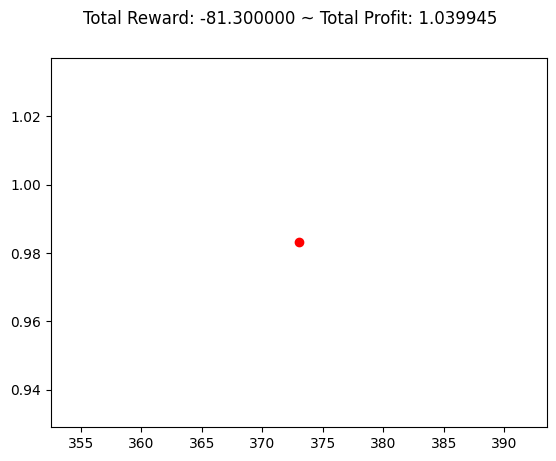

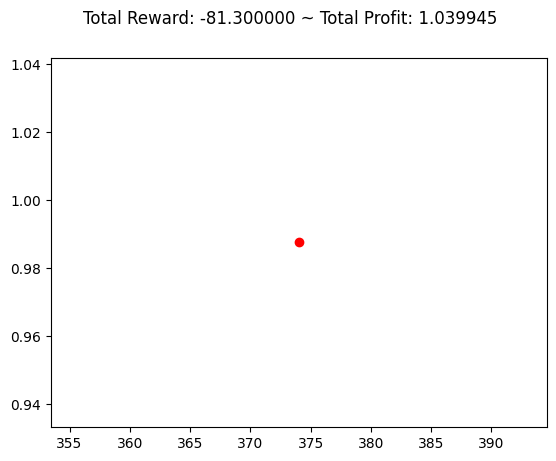

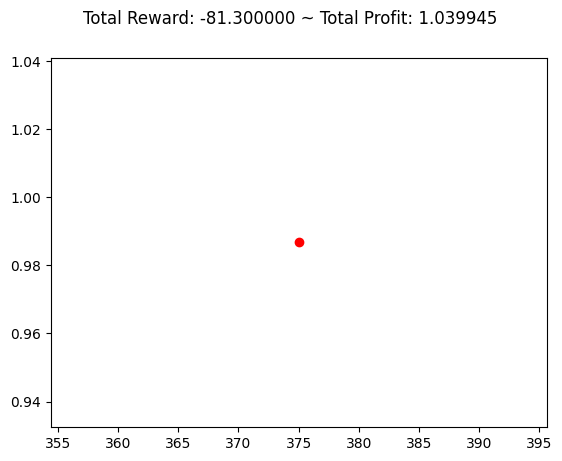

buy 


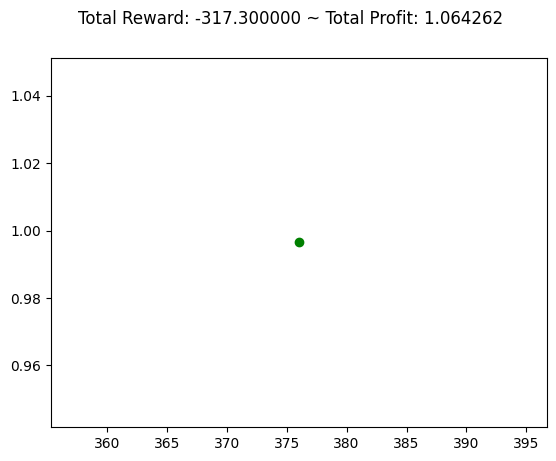

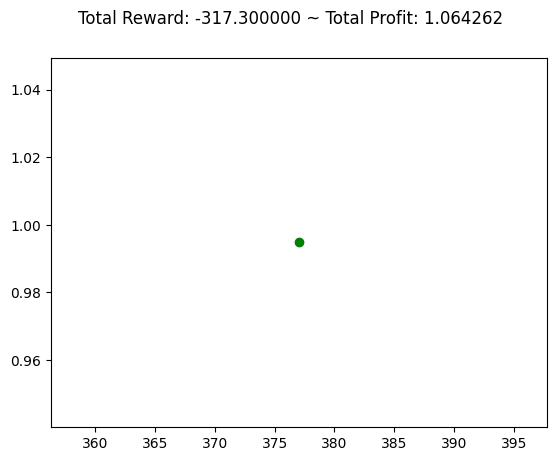

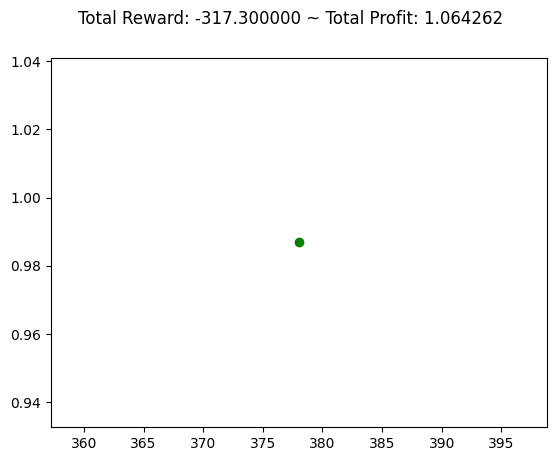

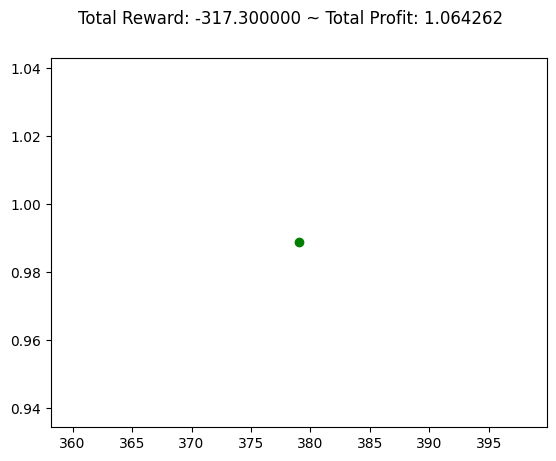

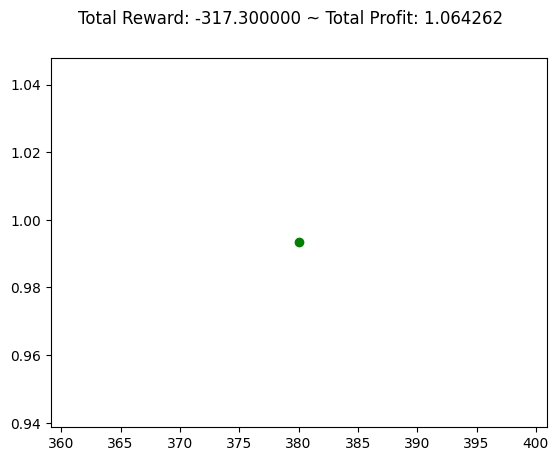

sell 


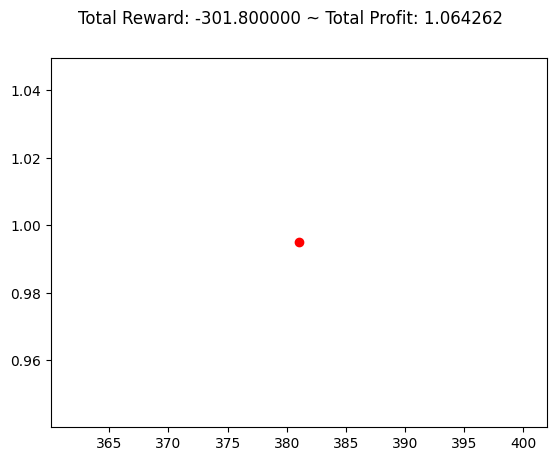

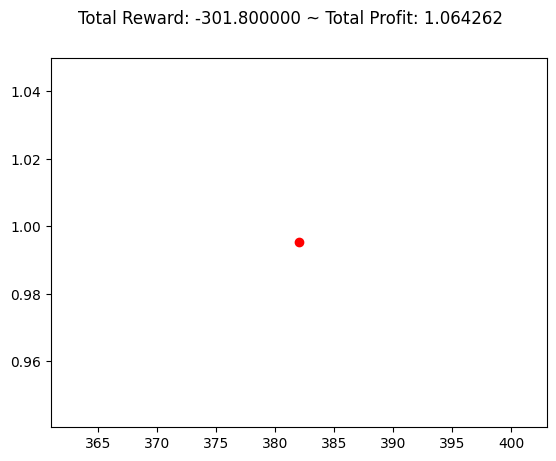

buy 


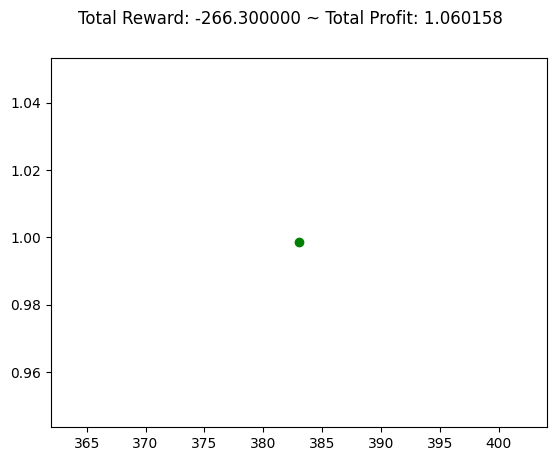

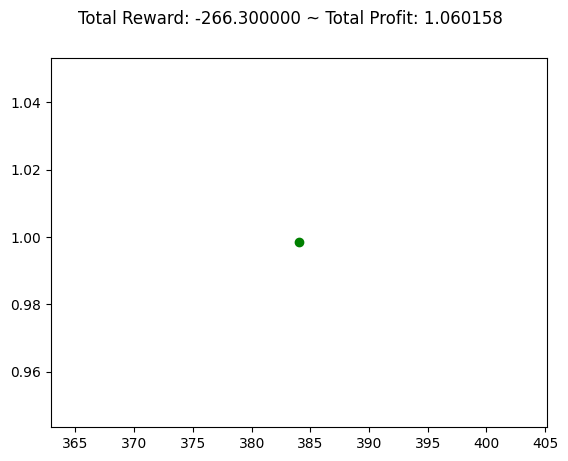

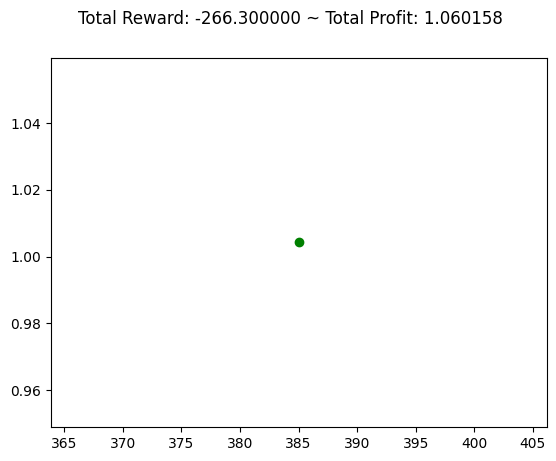

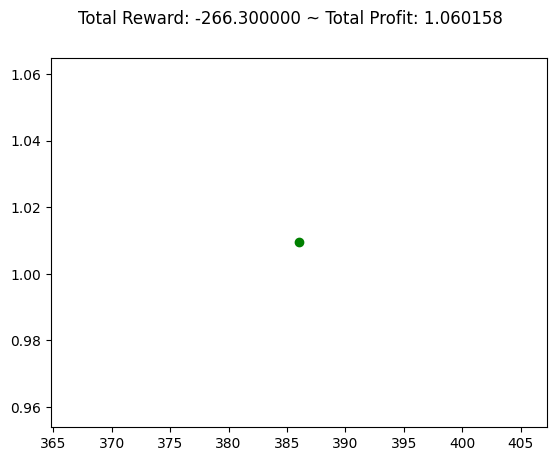

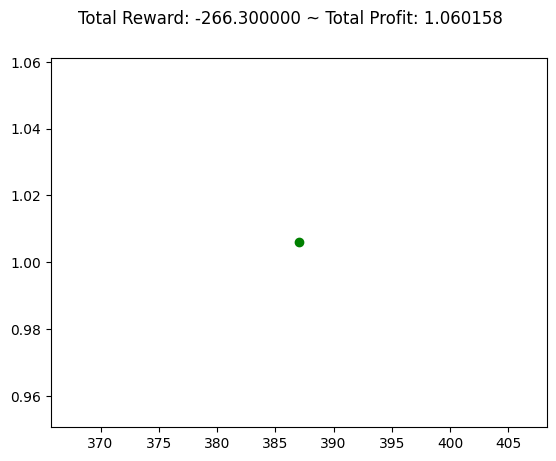

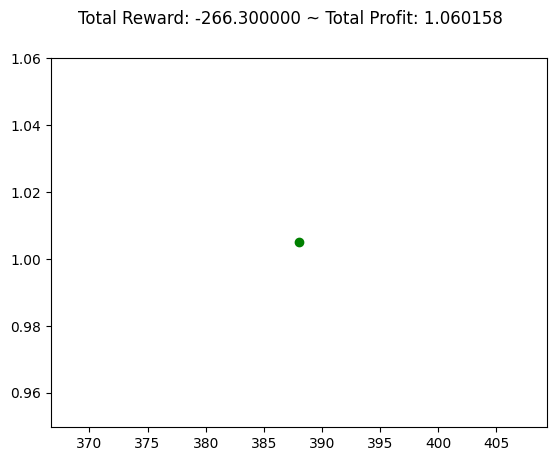

sell 


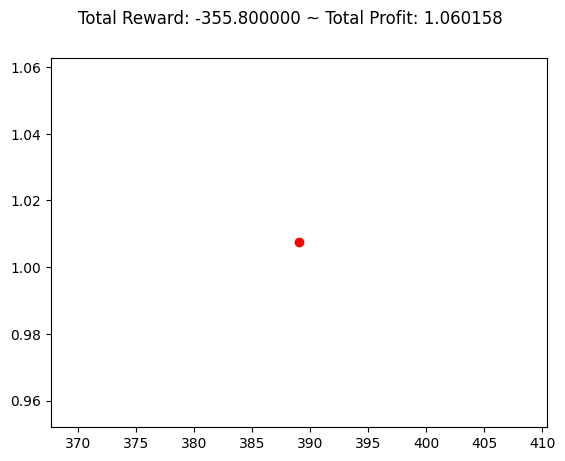

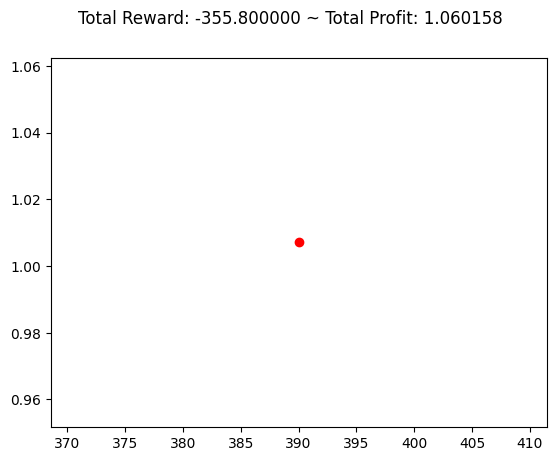

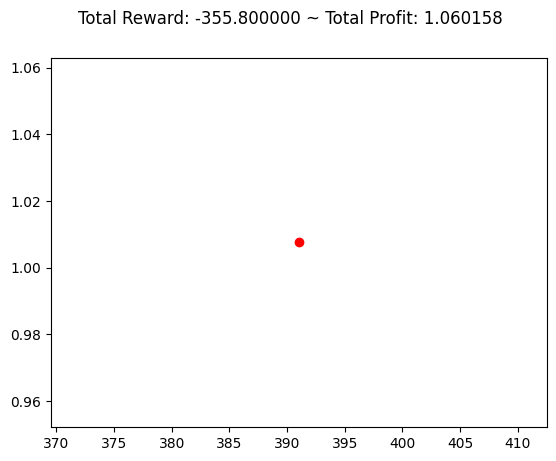

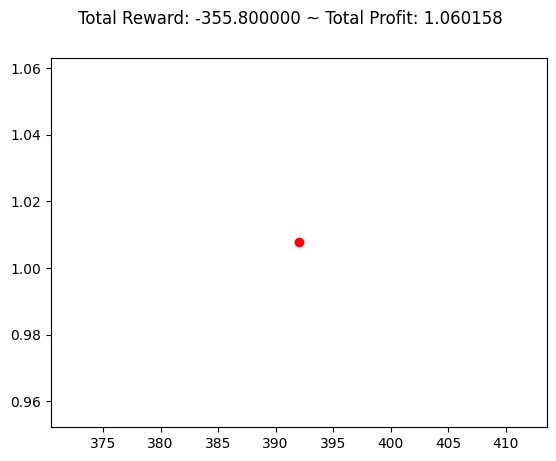

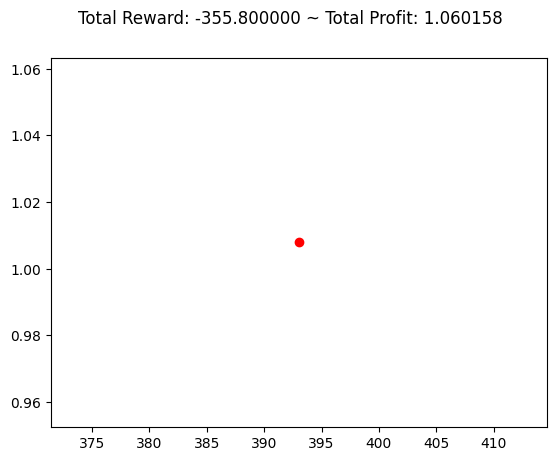

...

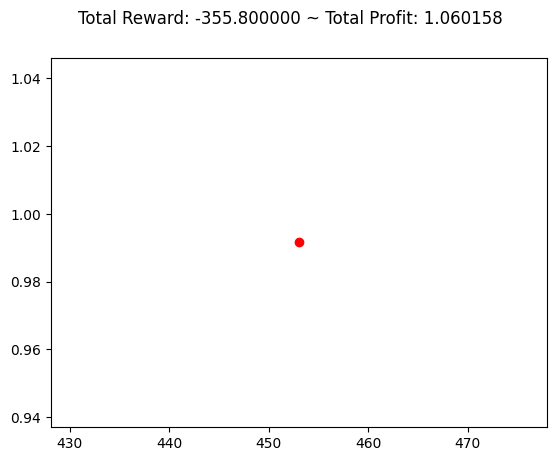

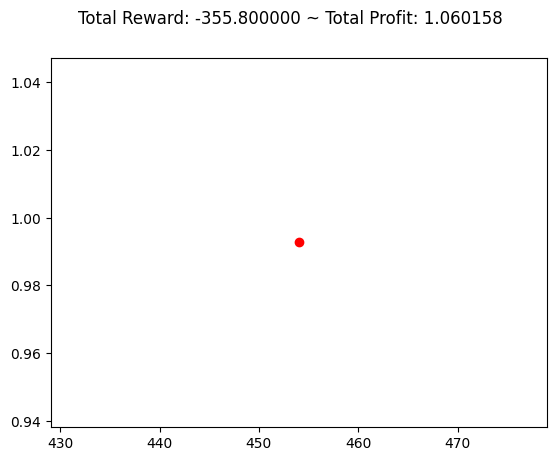

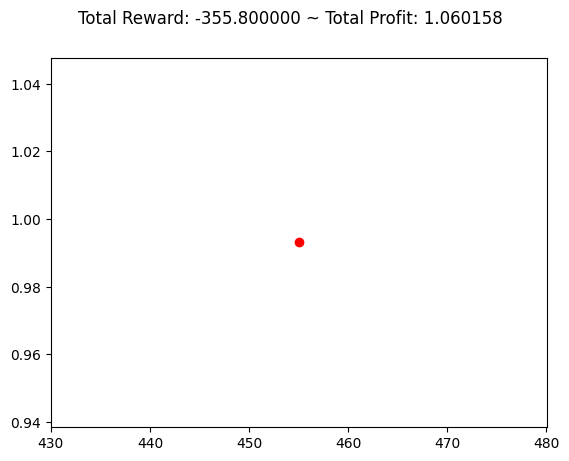

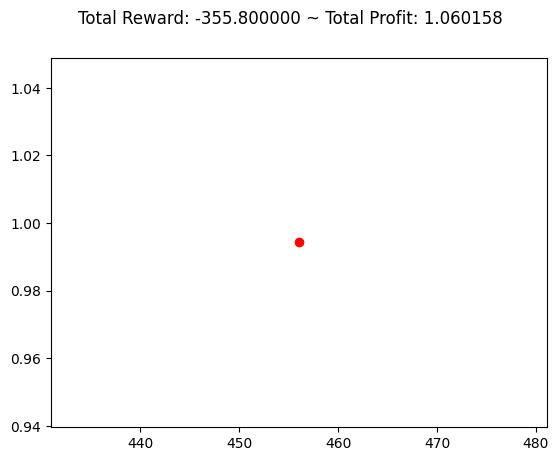

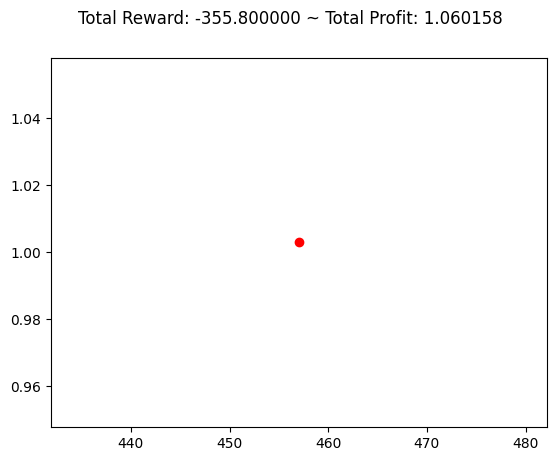

buy 


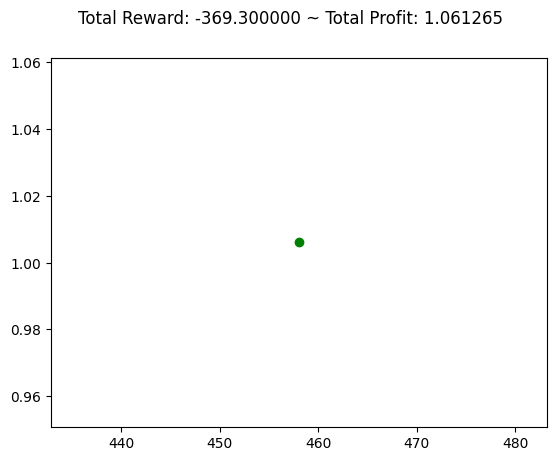

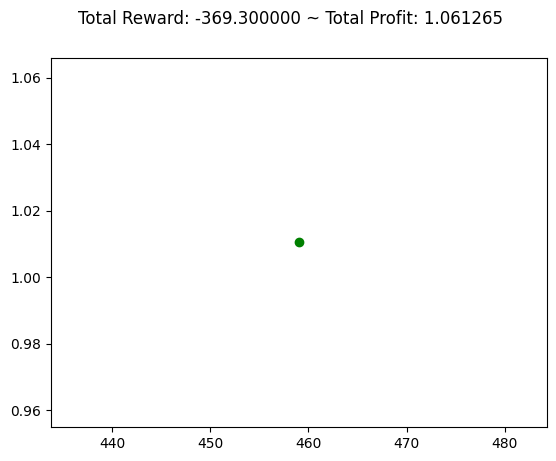

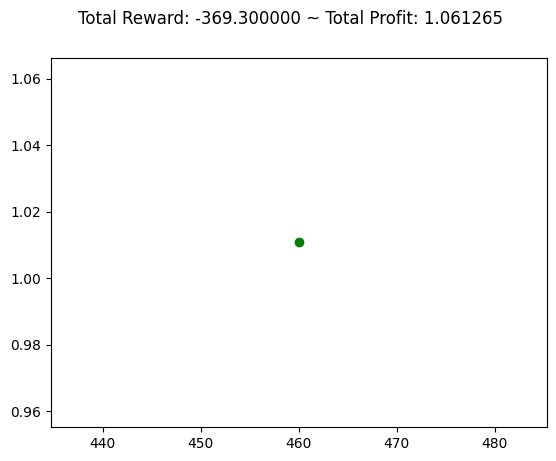

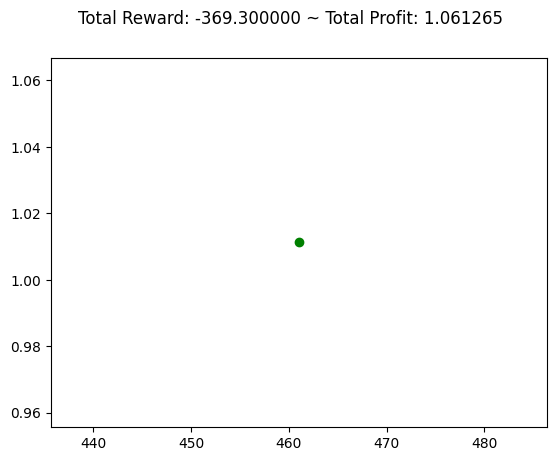

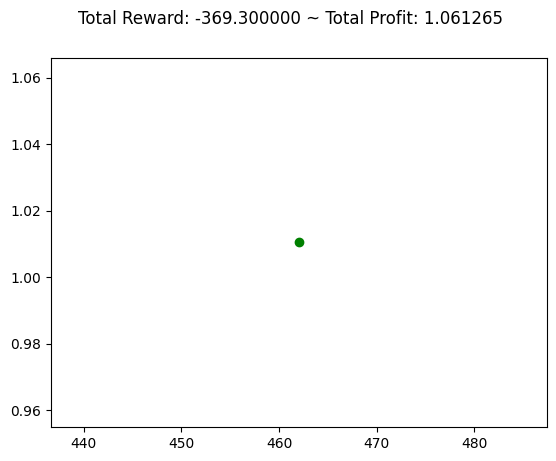

sell 


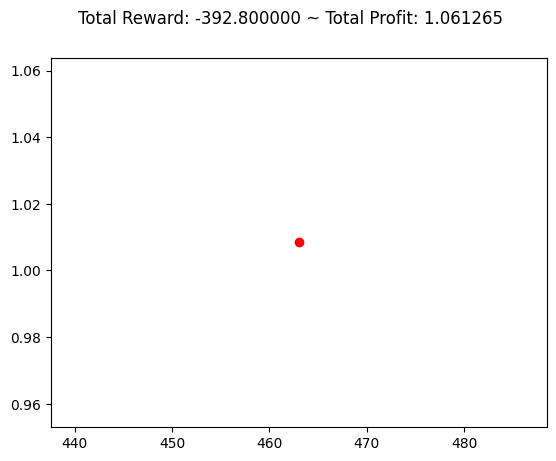

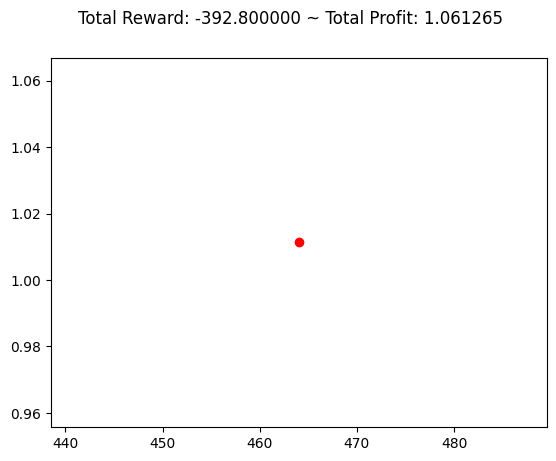

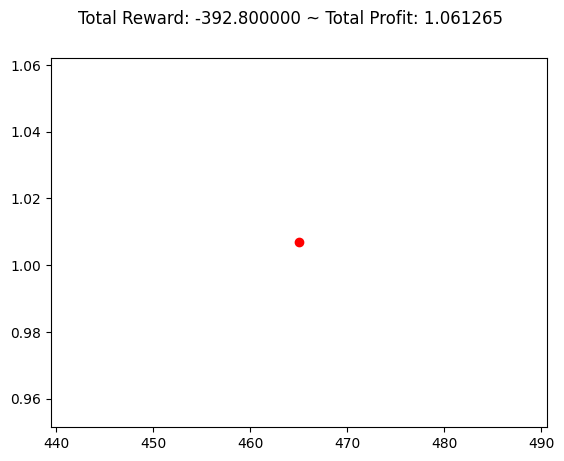

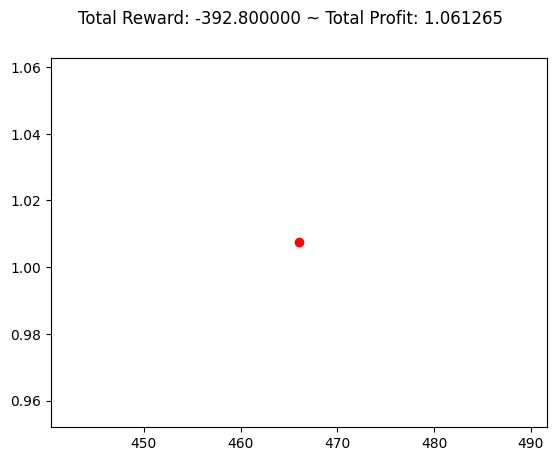

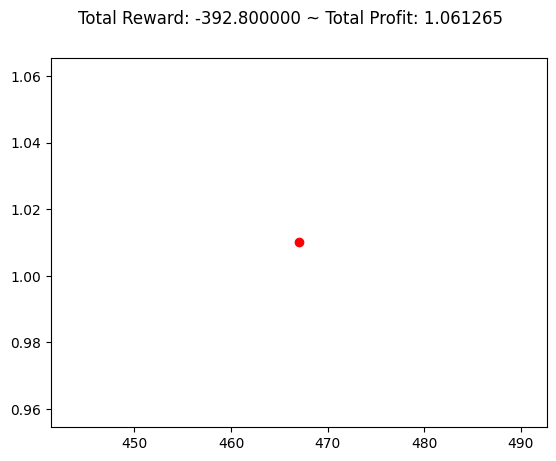

...

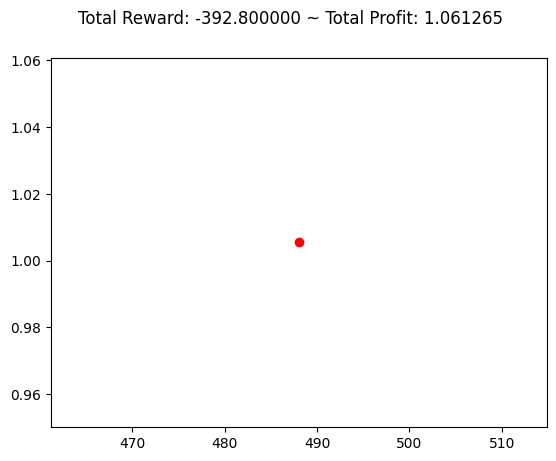

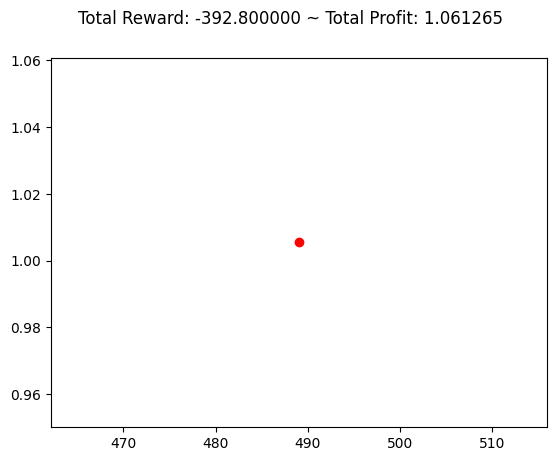

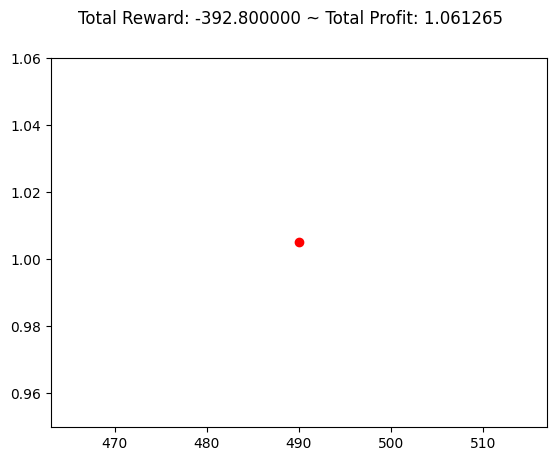

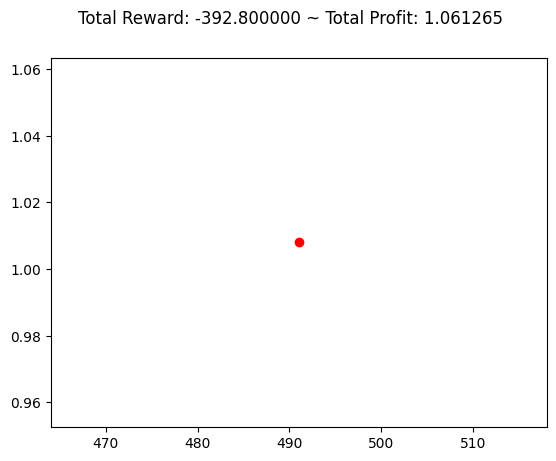

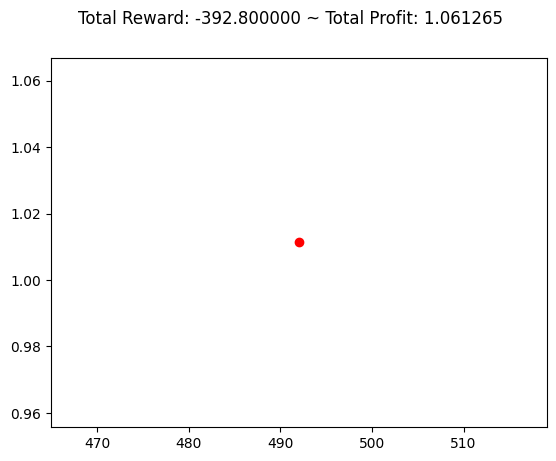

buy 


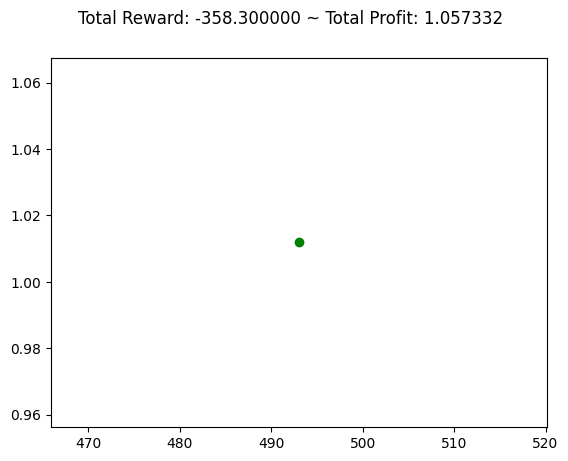

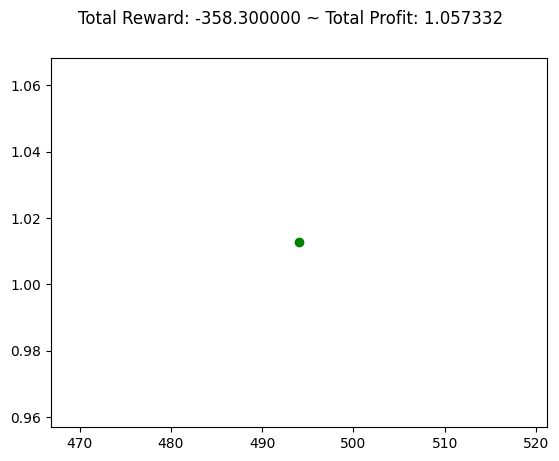

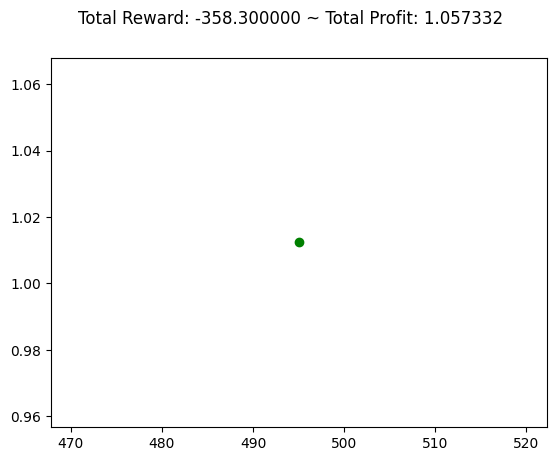

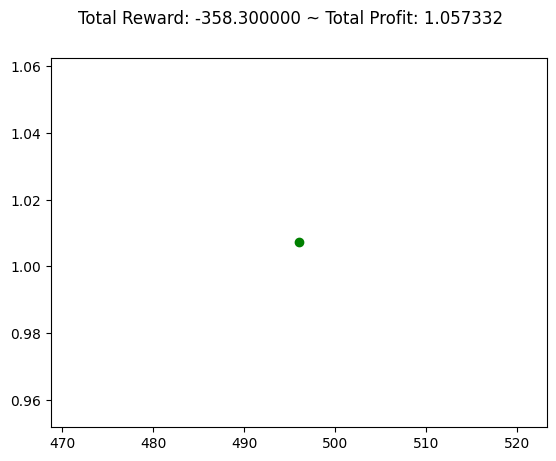

sell 


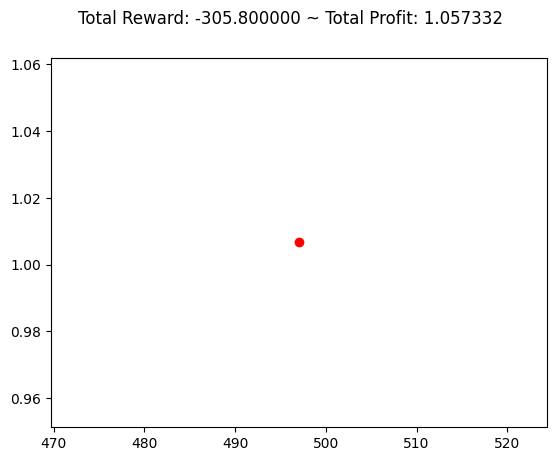

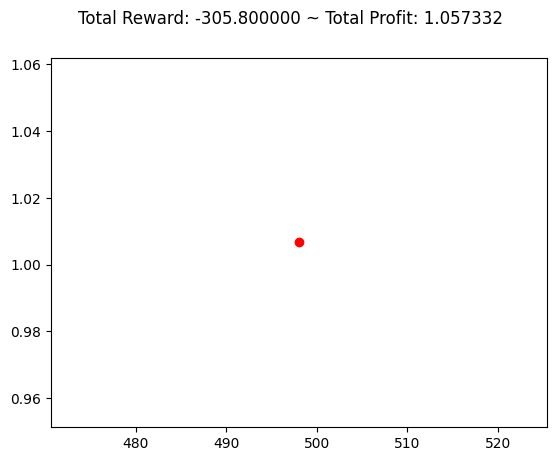

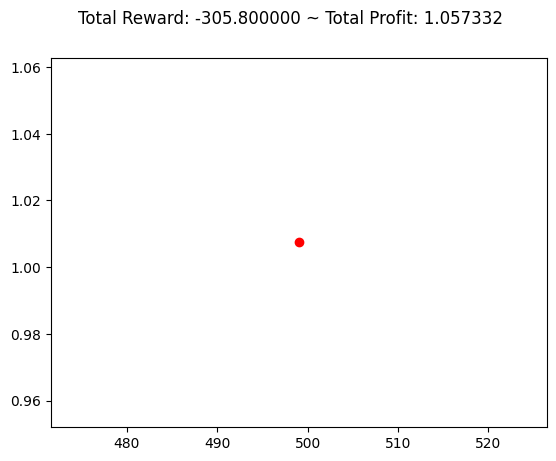

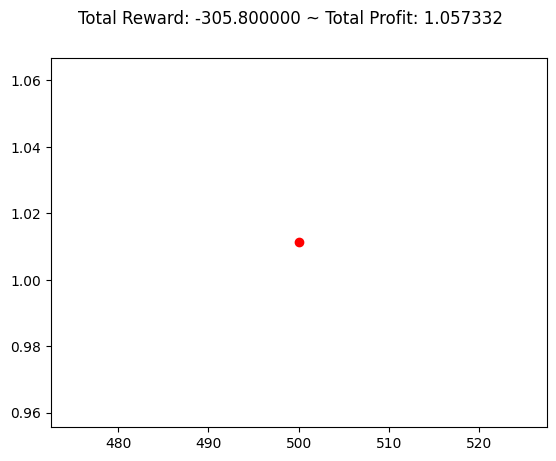

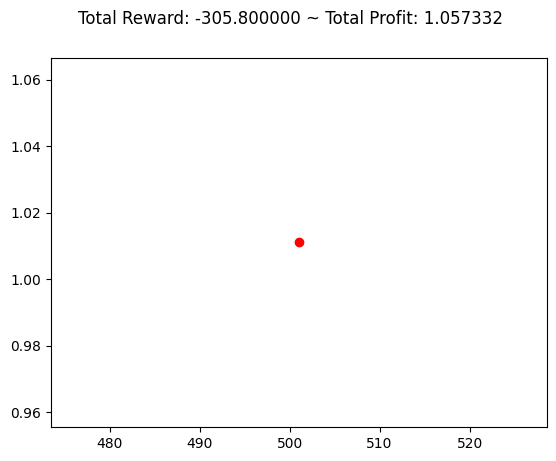

...

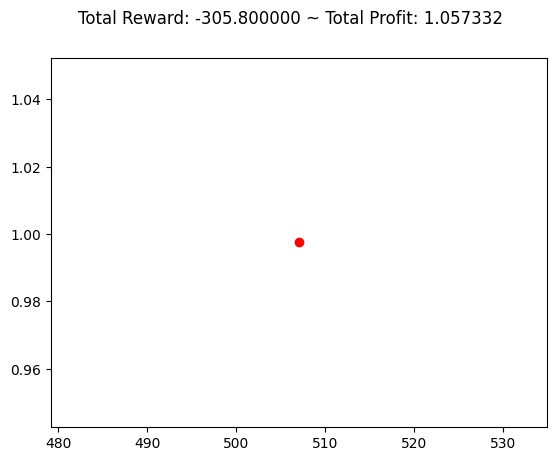

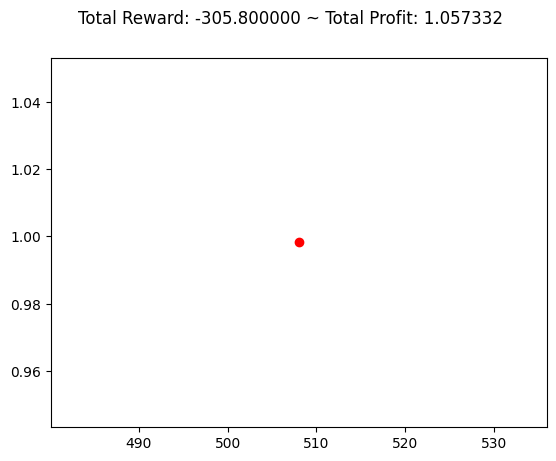

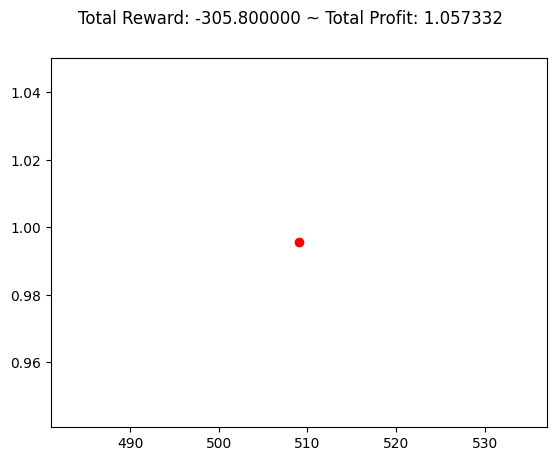

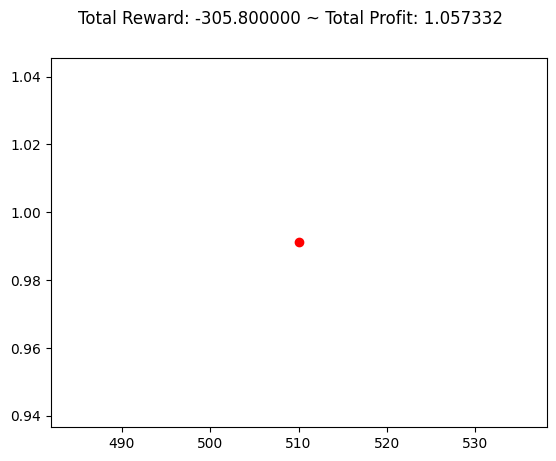

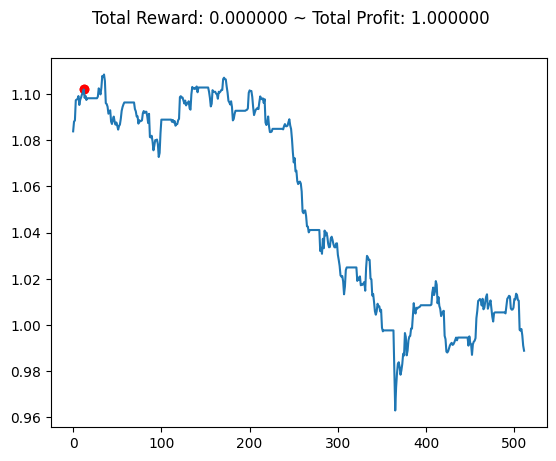

(-305.80000400543213, 0.0)

In [81]:
evaluate_policy(model1, env, n_eval_episodes = 1, render = True)

In [70]:
reccurent_ppo

'training\\save_model\\reccurent Rl2'

In [102]:
!tensorboard --logdir={tensorpath}

^C


In [146]:
RecurrentPPO??

C:\Users\Emakam leumassa\AppData\Local\Temp\ipykernel_16252\1907678216.py:1: FutureWarning: The behavior of `series[i:j]` with an integer-dtype index is deprecated. In a future version, this will be treated as *label-based* indexing, consistent with e.g. `series[i]` lookups. To retain the old behavior, use `series.iloc[i:j]`. To get the future behavior, use `series.loc[i:j]`.
  data['EMAF']=ta.ema(data.Close, length=5)
C:\Users\Emakam leumassa\AppData\Local\Temp\ipykernel_16252\1907678216.py:2: FutureWarning: The behavior of `series[i:j]` with an integer-dtype index is deprecated. In a future version, this will be treated as *label-based* indexing, consistent with e.g. `series[i]` lookups. To retain the old behavior, use `series.iloc[i:j]`. To get the future behavior, use `series.loc[i:j]`.
  data['EMAM']=ta.ema(data.Close, length=8)


*
*
.
.
*
*
.
.
*
*
*
*
.
.
*
.
*
.
*
*
.
*
*
info {'total_reward': -66.3000000000058, 'total_profit': 0.9914833202755419, 'position': 1}


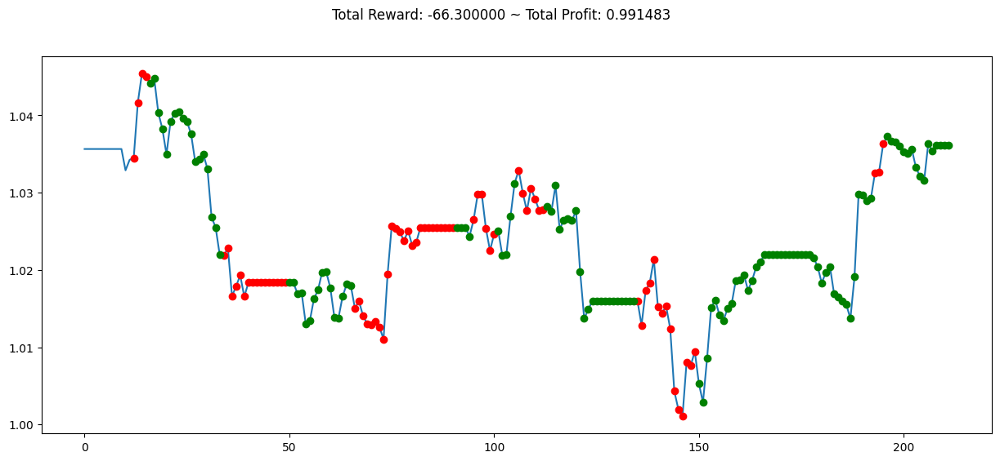

In [32]:
data['EMAF']=ta.ema(data.Close, length=5)
data['EMAM']=ta.ema(data.Close, length=8)

def mytarget1( state, df = data[500:]):
    ac = None
    
    for line in range(len(state)):
        if state[line] == None:
            state[line] = 1
            entry = list(df['entry'])
            smm = list(df['EMAF'])
            smb = list(df['EMAM'])
            sig = list(df['signal'])
            if sig[line] == 0 or sig[line] == 1 :
                    return 1, state
            if sig[line] == -1:
                     return 0, state
                            
lenght = len(data[500:])
state = env.reset()
mem = [None] * lenght
while True: 
    
    action, mem = mytarget1(mem)
    
 
    #print(action)
    #action = env.action_space.sample()
    n_state, reward, done, info = env.step(action)
    if done: 
        print("info", info)
        break
        
plt.figure(figsize=(15,6))
plt.cla()
env.render_all()
plt.show()